In [875]:
import pandas as pd
import numpy as np 
import seaborn as sns
from matplotlib import pyplot as plt
import warnings 
warnings.filterwarnings('ignore')
import missingno as msno
import time

In [876]:
df =  pd.read_csv('weatherAUS.csv')

In [877]:
pd.set_option('display.max_columns',24)
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No


In [878]:
df.shape

(142193, 24)

In [879]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142193 entries, 0 to 142192
Data columns (total 24 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           142193 non-null  object 
 1   Location       142193 non-null  object 
 2   MinTemp        141556 non-null  float64
 3   MaxTemp        141871 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81350 non-null   float64
 6   Sunshine       74377 non-null   float64
 7   WindGustDir    132863 non-null  object 
 8   WindGustSpeed  132923 non-null  float64
 9   WindDir9am     132180 non-null  object 
 10  WindDir3pm     138415 non-null  object 
 11  WindSpeed9am   140845 non-null  float64
 12  WindSpeed3pm   139563 non-null  float64
 13  Humidity9am    140419 non-null  float64
 14  Humidity3pm    138583 non-null  float64
 15  Pressure9am    128179 non-null  float64
 16  Pressure3pm    128212 non-null  float64
 17  Cloud9am       88536 non-null

In [880]:
df.isnull().sum()

Date                 0
Location             0
MinTemp            637
MaxTemp            322
Rainfall          1406
Evaporation      60843
Sunshine         67816
WindGustDir       9330
WindGustSpeed     9270
WindDir9am       10013
WindDir3pm        3778
WindSpeed9am      1348
WindSpeed3pm      2630
Humidity9am       1774
Humidity3pm       3610
Pressure9am      14014
Pressure3pm      13981
Cloud9am         53657
Cloud3pm         57094
Temp9am            904
Temp3pm           2726
RainToday         1406
RISK_MM              0
RainTomorrow         0
dtype: int64

<AxesSubplot:>

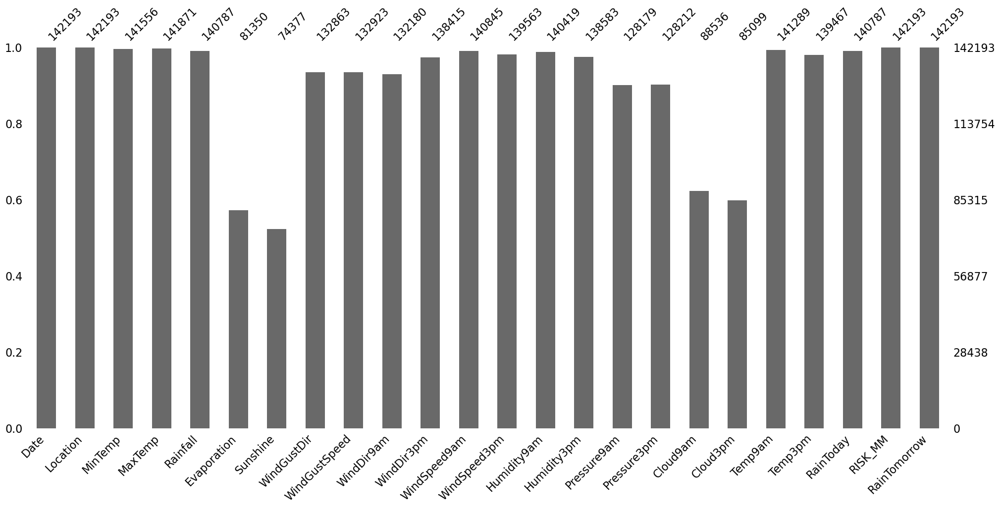

In [881]:
msno.bar(df) #Missing Values

In [882]:
round(df.isnull().mean()*100,2) #Missing values %

Date              0.00
Location          0.00
MinTemp           0.45
MaxTemp           0.23
Rainfall          0.99
Evaporation      42.79
Sunshine         47.69
WindGustDir       6.56
WindGustSpeed     6.52
WindDir9am        7.04
WindDir3pm        2.66
WindSpeed9am      0.95
WindSpeed3pm      1.85
Humidity9am       1.25
Humidity3pm       2.54
Pressure9am       9.86
Pressure3pm       9.83
Cloud9am         37.74
Cloud3pm         40.15
Temp9am           0.64
Temp3pm           1.92
RainToday         0.99
RISK_MM           0.00
RainTomorrow      0.00
dtype: float64

In [883]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,141556.0,12.186400,6.403283,-8.5,7.6,12.0,16.8,33.9
MaxTemp,141871.0,23.226784,7.117618,-4.8,17.9,22.6,28.2,48.1
Rainfall,140787.0,2.349974,8.465173,0.0,0.0,0.0,0.8,371.0
Evaporation,81350.0,5.469824,4.188537,0.0,2.6,4.8,7.4,145.0
Sunshine,74377.0,7.624853,3.781525,0.0,4.9,8.5,10.6,14.5
WindGustSpeed,132923.0,39.984292,13.588801,6.0,31.0,39.0,48.0,135.0
WindSpeed9am,140845.0,14.001988,8.893337,0.0,7.0,13.0,19.0,130.0
WindSpeed3pm,139563.0,18.637576,8.803345,0.0,13.0,19.0,24.0,87.0
Humidity9am,140419.0,68.843810,19.051293,0.0,57.0,70.0,83.0,100.0
Humidity3pm,138583.0,51.482606,20.797772,0.0,37.0,52.0,66.0,100.0


<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

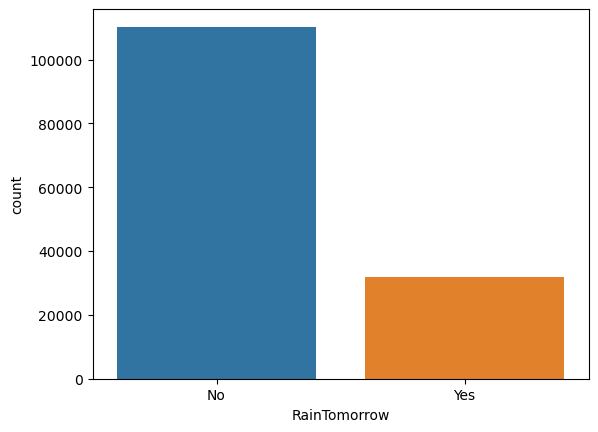

In [884]:
plt.rcdefaults()
sns.countplot(df['RainTomorrow']) #Imbalnce found in target feature

In [885]:
df_num = df.select_dtypes(exclude='O')

In [886]:
df_num.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RISK_MM
0,13.4,22.9,0.6,NaN,NaN,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,0.0
1,7.4,25.1,0.0,NaN,NaN,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,0.0
2,12.9,25.7,0.0,NaN,NaN,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,0.0
3,9.2,28.0,0.0,NaN,NaN,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,1.0
4,17.5,32.3,1.0,NaN,NaN,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0.2


In [887]:
pos =1
plt.figure(figsize=(100,100))

for i in df_num.columns:
    sns.set(font_scale = 8)
    plt.subplot(8,3,pos)
    sns.distplot(df[i], kde_kws={"color": "k", "lw": 3, "label": "KDE"})
    plt.title(i,fontweight="bold",fontsize=50) 
    pos +=1
    plt.tight_layout()
#Most distribution of min temp is btwn 10 and 15 degrees
#max temp is mostly 20-25
#Density of rainfall are in very low units
#Maximum wind speed at 9AM ranges from 10 to 20 km/hr
#at 3PM it ranges from 15 to 22 km/hr.
#Highest concentration of points for humidity at 9AM is between 60-80% whereas at 3PM it's 40-70%.
#Highest concentration of points for pressure at 9AM is between 1015-1018 hpa and at 3PM it's between 1015-1017 hpa.
#Maximum temperature at 9AM is between 16-18 degree Celcius and at 3PM it's between 21-23 degree Celcius.


In [888]:
#fill missing values in numerical columns using location

In [889]:
numerical = df_num.columns
loc_for_miss = df["Location"].unique().tolist()
ls = []
def removeNull(columns):
    j=0
    while j<=len(columns)-1:
        for i in range(len(loc_for_miss)): 
            ls.append(str(df.loc[df["Location"] == loc_for_miss[i], columns[j]].median())) #great outliers so used median

        for i in range(len(loc_for_miss)):
            df.loc[df["Location"] == loc_for_miss[i], columns[j]] = df.loc[df["Location"] == loc_for_miss[i], columns[j]].fillna(ls[i])
        j+=1
        df[columns] = df[columns].astype(float)
        
removeNull(numerical)

In [890]:
pos =1
plt.figure(figsize=(100,100))

for i in df_num.columns:
    sns.set(font_scale = 8)
    plt.subplot(9,2,pos)
    sns.distplot(df[i], kde_kws={"color": "k", "lw": 3, "label": "KDE"})
    plt.title(i,fontweight="bold",fontsize=50) 
    pos +=1
    plt.tight_layout()
#Dist for pressure have been changes small peak has been introtuded

In [891]:
df_cat =  df.select_dtypes(include='O')
df_cat.isnull().sum()

Date                0
Location            0
WindGustDir      9330
WindDir9am      10013
WindDir3pm       3778
RainToday        1406
RainTomorrow        0
dtype: int64

In [892]:
df_cat.columns

Index(['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm',
       'RainToday', 'RainTomorrow'],
      dtype='object')

In [893]:
col = [ 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm','RainToday', 'RainTomorrow']

In [894]:
pos =1
plt.figure(figsize=(100,100))

for i in col:
    sns.set(font_scale = 8)
    plt.subplot(5,2,pos)
    sns.countplot(df[i])
    plt.title(i,fontweight="bold",fontsize=50) 
    pos +=1
    plt.xticks(rotation=90)
    plt.tight_layout()
    
#Sydney,canbeera,perth have the most rainfall
#Nhil,uluru and katherne has least occurances of rainfall
#Windgust is most in the west direction followed by north and south east and South west
# similarly  wind direction is starting from North at 9 am at peak and hads to wards south east by 3pm 
#Chances of occurance of rain on current day is low compared 


In [895]:
#Issue was there are 2 locations where there is no windgustdir value to refer and fill na
categorical = ['WindDir9am','WindDir3pm','RainToday']
loc_for_miss = df["Location"].unique().tolist()
ls = []
def removeNull(columns):
    for j in range(len(columns)):
        ls = []
        for i in range(len(loc_for_miss)): 
            ls.append(df.loc[df["Location"] == loc_for_miss[i], columns[j]].mode()[0])
        for i in range(len(loc_for_miss)):
            df.loc[df["Location"] == loc_for_miss[i], columns[j]] = df.loc[df["Location"] == loc_for_miss[i], columns[j]].fillna(ls[i])
        df[columns] = df[columns].astype(object)
    
removeNull(categorical)

In [896]:
df.isnull().sum()

Date                0
Location            0
MinTemp             0
MaxTemp             0
Rainfall            0
Evaporation         0
Sunshine            0
WindGustDir      9330
WindGustSpeed       0
WindDir9am          0
WindDir3pm          0
WindSpeed9am        0
WindSpeed3pm        0
Humidity9am         0
Humidity3pm         0
Pressure9am         0
Pressure3pm         0
Cloud9am            0
Cloud3pm            0
Temp9am             0
Temp3pm             0
RainToday           0
RISK_MM             0
RainTomorrow        0
dtype: int64

In [897]:
df[['Location','WindGustDir']].groupby('Location').count()
#Issue was there are 2 locations where there is no windgustdir value to refer and fill na
#we will take the nearest location value to fill these 
# 'Newcastle' is near to "Sydnay" with mode W,
# 'Albany' is near to "Perth" with mode SW
def Impute(df):
    WindGustDir = df[0]
    location = df[1]
    
    if pd.isnull(WindGustDir):
        if location == 'Albany':return 'SW'
        else: return 'W' #mode of the column
    else:
        return WindGustDir

# Age Impute
df['WindGustDir'] = df[['WindGustDir' , 'Location']].apply(Impute, axis = 1)

In [898]:
pos =1
plt.figure(figsize=(100,100))
for i in col:
    sns.set(font_scale = 8)
    plt.subplot(5,2,pos)
    sns.countplot(df[i])
    plt.title(i,fontweight="bold",fontsize=50) 
    pos +=1
    plt.xticks(rotation=90)
    plt.tight_layout()

In [899]:
pos =1
plt.figure(figsize=(100,100))
for i in col:
    sns.set(font_scale = 8)
    plt.subplot(5,2,pos)
    sns.countplot(df[i],hue=df['RainTomorrow'])
    plt.title(i,fontweight="bold",fontsize=50) 
    pos +=1
    plt.xticks(rotation=90)
    plt.tight_layout()

In [900]:
#lets explore using date column

In [901]:
df['Date'] = pd.to_datetime(df['Date']).dt.strftime('%Y-%m-%d')
df['Day'] = df['Date'].apply(lambda s: str(s)[8:10])
df['Day'] = df['Day'].astype('int64')
df['Month'] = df['Date'].apply(lambda s: str(s)[5:7])
df['Month'] = df['Month'].astype('int64')
df['Year'] = df['Date'].apply(lambda s: str(s)[0:4])
df['Year'] = df['Year'].astype('int64')

In [902]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow,Day,Month,Year
0,2008-12-01,Albury,13.4,22.9,0.6,9.1,9.1,W,44.0,W,WNW,20.0,...,1007.7,1007.1,8.0,9.1,16.9,21.8,No,0.0,No,1,12,2008
1,2008-12-02,Albury,7.4,25.1,0.0,9.1,9.1,WNW,44.0,NNW,WSW,4.0,...,1010.6,1007.8,9.1,9.1,17.2,24.3,No,0.0,No,2,12,2008
2,2008-12-03,Albury,12.9,25.7,0.0,9.1,9.1,WSW,46.0,W,WSW,19.0,...,1007.6,1008.7,9.1,2.0,21.0,23.2,No,0.0,No,3,12,2008
3,2008-12-04,Albury,9.2,28.0,0.0,9.1,9.1,NE,24.0,SE,E,11.0,...,1017.6,1012.8,9.1,9.1,18.1,26.5,No,1.0,No,4,12,2008
4,2008-12-05,Albury,17.5,32.3,1.0,9.1,9.1,W,41.0,ENE,NW,7.0,...,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No,5,12,2008


<AxesSubplot:xlabel='Year', ylabel='count'>

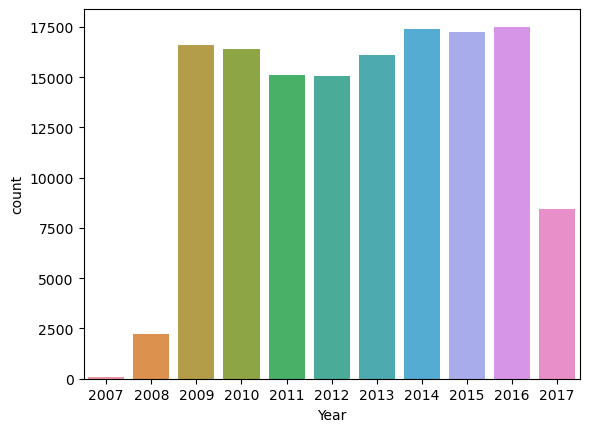

In [903]:
plt.rcdefaults()
sns.countplot(df['Year'])
#The rainfall has increased from since 2009

In [904]:
effc = pd.crosstab(df['Year'],df['RainTomorrow'])
effc['tot'] = effc['No']+effc['Yes']
effc['effective'] = round(effc['Yes']/effc['tot'] *100,2)
effc.sort_values(by='effective',ascending=False)
#Rain Chances each Year considering the it will rain tmrw

RainTomorrow,No,Yes,tot,effective
Year,,,,
2007,42,19,61,31.15
2011,11388,3738,15126,24.71
2010,12422,3997,16419,24.34
2016,13325,4183,17508,23.89
2008,1735,511,2246,22.75
2012,11655,3389,15044,22.53
2009,12988,3607,16595,21.74
2013,12632,3465,16097,21.53
2015,13583,3648,17231,21.17


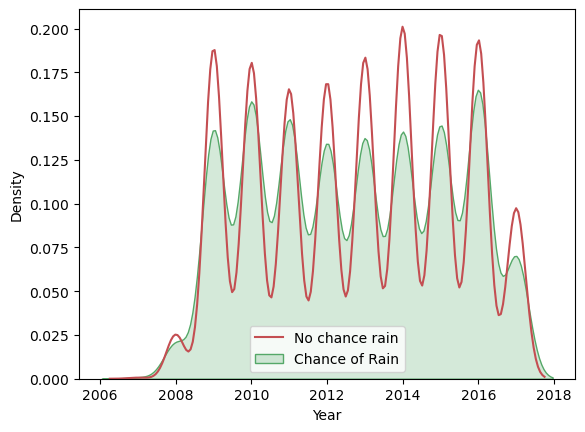

In [905]:
plt.rcdefaults()
data = df.copy()
data['RainTomorrow'].replace({'Yes':1,'No':0},inplace=True)
sns.kdeplot(data[data['RainTomorrow']== 0]['Year'],color='r',label='No chance rain')
sns.kdeplot(data[data['RainTomorrow']== 1]['Year'],color='g',label='Chance of Rain',shade=True)
plt.legend()

In [906]:
#Effective chance of rain in 2007 was high and less chances of rain during 2014

Int64Index([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], dtype='int64', name='Month')


Text(0.5, 1.0, 'Chance of rain /month')

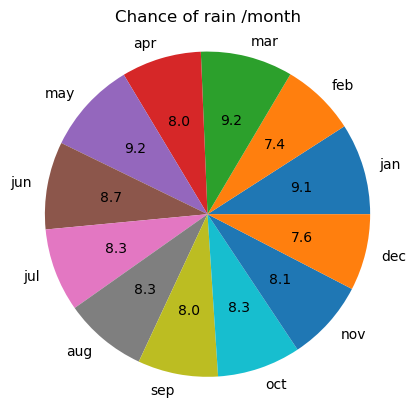

In [907]:
norain = pd.crosstab(df['RainTomorrow'],df['Month']).iloc[0]
rain = pd.crosstab(df['RainTomorrow'],df['Month']).iloc[1]
tot = norain+rain
print(tot.index)
#labels = ['apr', 'aug', 'dec', 'feb', 'jan', 'jul', 'jun', 'mar', 'may', 'nov','oct', 'sep']
labels = ['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec']
plt.rcdefaults()
plt.pie(tot,labels=labels,autopct='%.1f',radius=1.1,)
plt.title('Chance of rain /month')


<AxesSubplot:xlabel='Month', ylabel='count'>

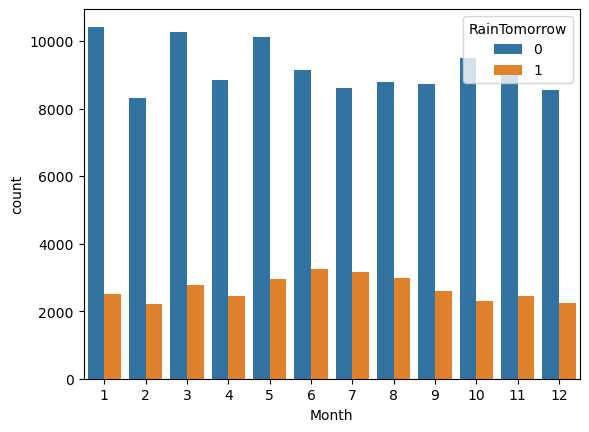

In [908]:
sns.countplot(data['Month'],hue=data['RainTomorrow'])

<AxesSubplot:xlabel='Day', ylabel='count'>

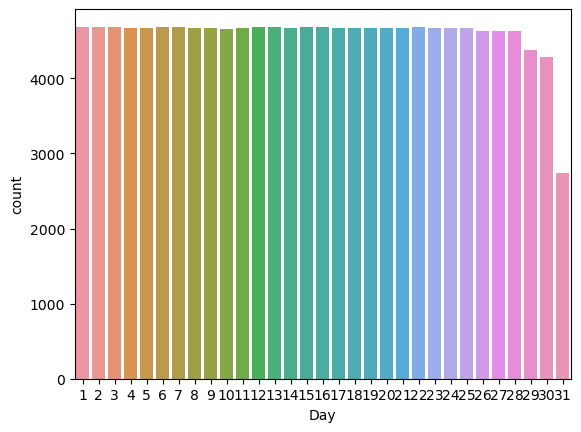

In [909]:
sns.countplot(data['Day'])



In [910]:
#lets cat by seasons

df['season'] = np.nan
lst=[df]
# The conditions for determining each of the seasons.
for column in lst:
    column.loc[(column["Month"] >= 3) & (column["Month"] <= 5), 'season'] = 'spring'
    column.loc[(column["Month"] >= 6) & (column["Month"] <= 8), 'season'] = 'summer'
    column.loc[(column["Month"] >= 9) & (column["Month"] <= 11), 'season'] = 'fall'
    column.loc[column["Month"] <= 2, 'season'] = 'winter'
    column.loc[column["Month"] == 12, 'season'] = 'winter'
    
df['season'].value_counts()

spring    37397
summer    35930
fall      34610
winter    34256
Name: season, dtype: int64

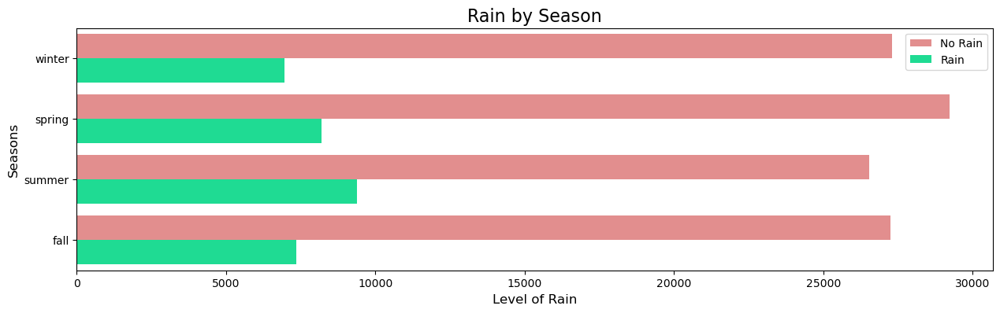

In [911]:
fig = plt.figure(figsize=(15,4),)

colors = ['#F08080', '#00FA9A']

ax = sns.countplot(y='season', data=df,
           hue='RainTomorrow',
           palette = colors
          ) 

plt.title("Rain by Season", fontsize=16)
plt.ylabel("Seasons", fontsize=12)
plt.xlabel("Level of Rain", fontsize=12)
legend_name = plt.legend()
legend_name.get_texts()[0].set_text('No Rain')
legend_name.get_texts()[1].set_text('Rain')

plt.show()

In [912]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow,Day,Month,Year,season
0,2008-12-01,Albury,13.4,22.9,0.6,9.1,9.1,W,44.0,W,WNW,20.0,...,1007.1,8.0,9.1,16.9,21.8,No,0.0,No,1,12,2008,winter
1,2008-12-02,Albury,7.4,25.1,0.0,9.1,9.1,WNW,44.0,NNW,WSW,4.0,...,1007.8,9.1,9.1,17.2,24.3,No,0.0,No,2,12,2008,winter
2,2008-12-03,Albury,12.9,25.7,0.0,9.1,9.1,WSW,46.0,W,WSW,19.0,...,1008.7,9.1,2.0,21.0,23.2,No,0.0,No,3,12,2008,winter
3,2008-12-04,Albury,9.2,28.0,0.0,9.1,9.1,NE,24.0,SE,E,11.0,...,1012.8,9.1,9.1,18.1,26.5,No,1.0,No,4,12,2008,winter
4,2008-12-05,Albury,17.5,32.3,1.0,9.1,9.1,W,41.0,ENE,NW,7.0,...,1006.0,7.0,8.0,17.8,29.7,No,0.2,No,5,12,2008,winter


In [913]:
data = df.copy()
data['Mon_yr'] =  df['Date'].apply(lambda s: str(s)[0:7])

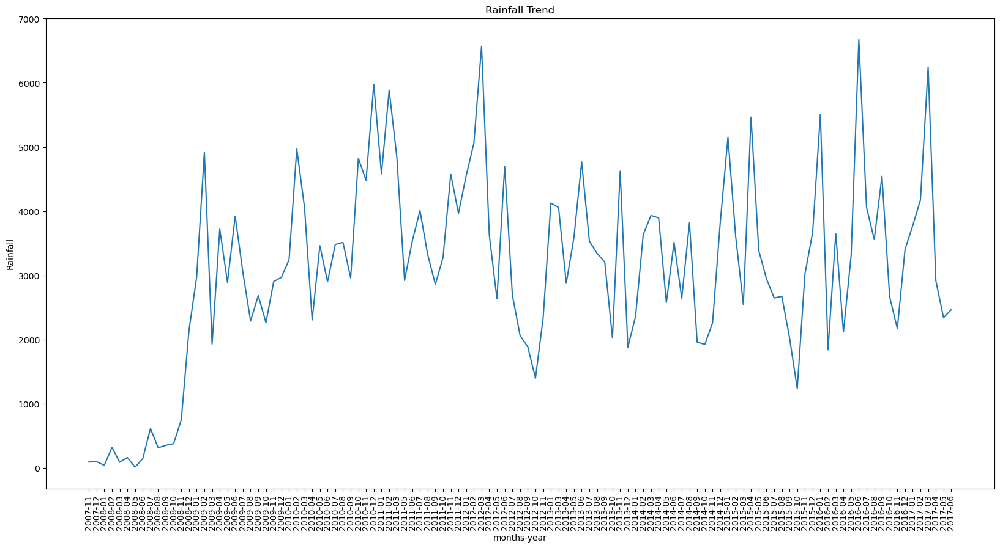

In [914]:
rain = data.drop_duplicates().groupby(['Mon_yr'])['Rainfall'].agg(['sum']).sort_values(by=['Mon_yr'], ascending=True)
x = pd.Series(rain.index.values)
y = rain['sum']
plt.figure(figsize=(20,10))
plt.plot(x,y)
plt.xlabel('months-year')
plt.ylabel('Rainfall')
plt.title('Rainfall Trend')
plt.xticks(rotation=90)
plt.show()

In [915]:
pd.set_option('display.max_columns',30)
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow,Day,Month,Year,season
0,2008-12-01,Albury,13.4,22.9,0.6,9.1,9.1,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,9.1,16.9,21.8,No,0.0,No,1,12,2008,winter
1,2008-12-02,Albury,7.4,25.1,0.0,9.1,9.1,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,9.1,9.1,17.2,24.3,No,0.0,No,2,12,2008,winter
2,2008-12-03,Albury,12.9,25.7,0.0,9.1,9.1,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,9.1,2.0,21.0,23.2,No,0.0,No,3,12,2008,winter
3,2008-12-04,Albury,9.2,28.0,0.0,9.1,9.1,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,9.1,9.1,18.1,26.5,No,1.0,No,4,12,2008,winter
4,2008-12-05,Albury,17.5,32.3,1.0,9.1,9.1,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No,5,12,2008,winter


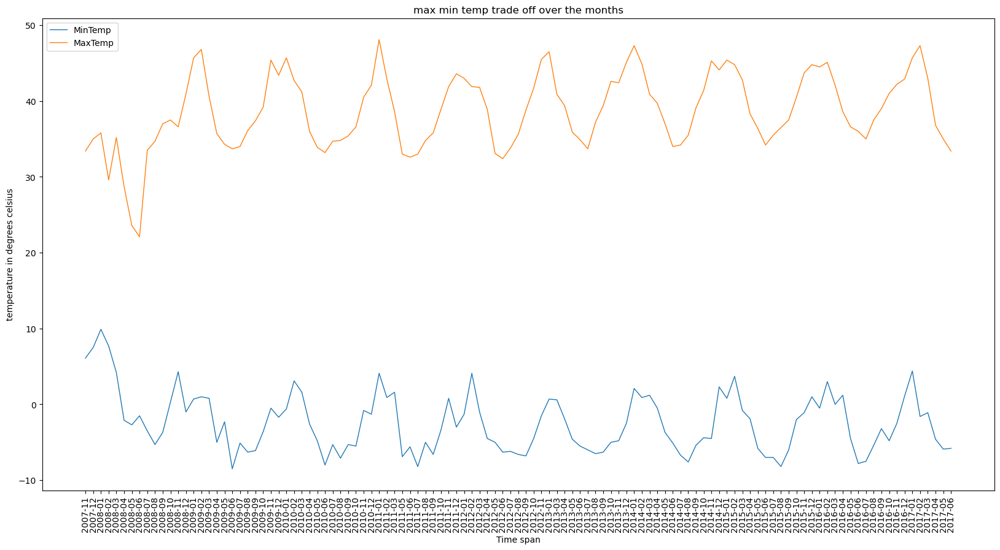

In [916]:
rain = data.drop_duplicates().groupby(['Mon_yr'])['MinTemp'].agg(['min']).sort_values(by=['Mon_yr'], ascending=True)
rain1 = data.drop_duplicates().groupby(['Mon_yr'])['MaxTemp'].agg(['max']).sort_values(by=['Mon_yr'], ascending=True)
x = pd.Series(rain.index.values)
y = rain['min']
y1 = rain1['max']
plt.figure(figsize=(20,10))
plt.plot(x,y, linewidth=1, label= 'MinTemp')
plt.plot(x,y1, linewidth=1, label= 'MaxTemp')
plt.xlabel('Time span')
plt.ylabel('temperature in degrees celsius')
plt.title('max min temp trade off over the months')
plt.xticks(rotation=90)
plt.legend()
plt.show()

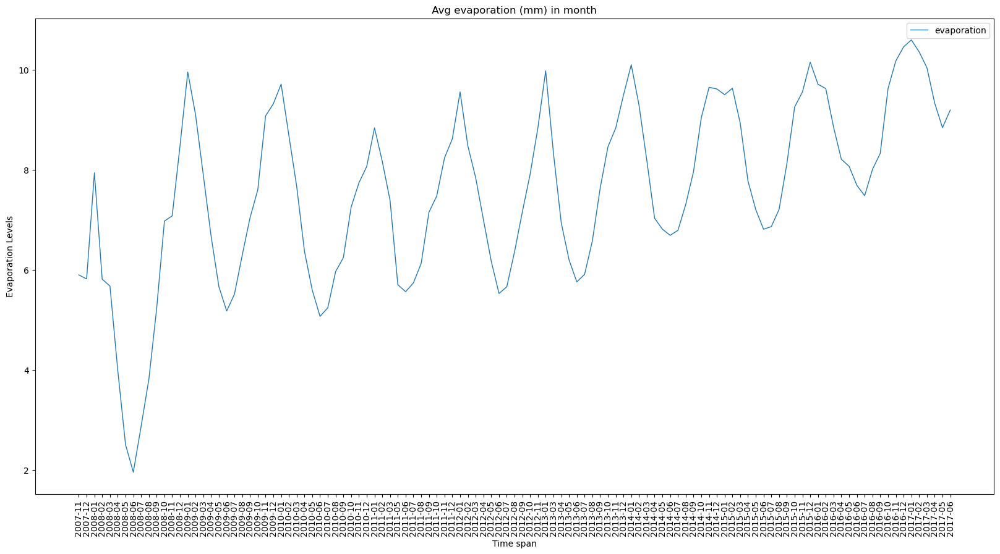

In [917]:
rain = data.drop_duplicates().groupby(['Mon_yr'])['Evaporation'].agg(['mean']).sort_values(by=['Mon_yr'], ascending=True)
x = pd.Series(rain.index.values)
y = rain['mean']
plt.figure(figsize=(20,10))
plt.plot(x,y, linewidth=1, label= 'evaporation')
plt.xlabel('Time span')
plt.title(' Avg evaporation (mm) in month ')
plt.ylabel('Evaporation Levels')
plt.xticks(rotation=90)
plt.legend()
plt.show()

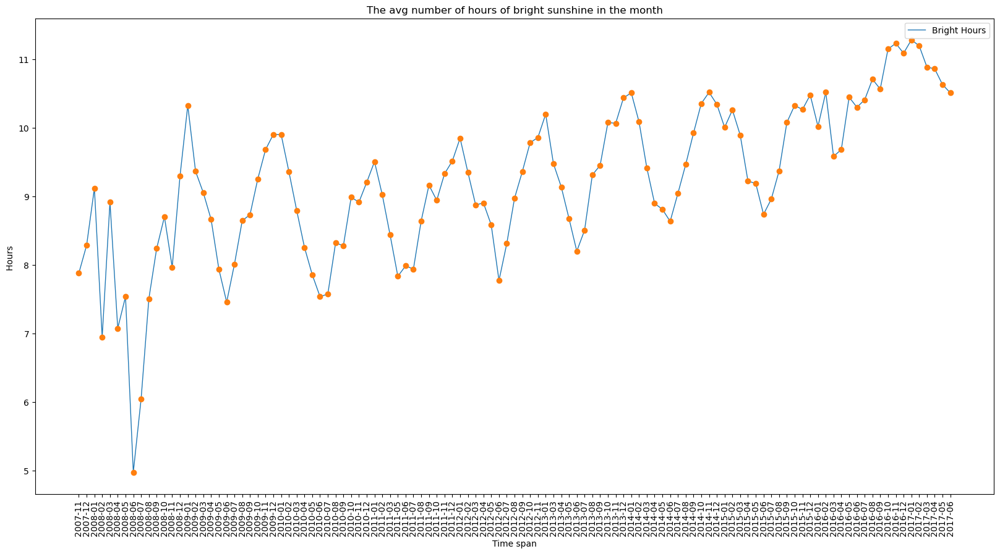

In [918]:
rain1 = data.drop_duplicates().groupby(['Mon_yr'])['Sunshine'].agg(['mean']).sort_values(by=['Mon_yr'], ascending=True)
x = pd.Series(rain.index.values)
y1 = rain1['mean']
plt.figure(figsize=(20,10))
plt.plot(x,y1, linewidth=1, label= 'Bright Hours')
plt.plot_date(x,y1)
plt.xlabel('Time span')
plt.ylabel('Hours ')
plt.title('The avg number of hours of bright sunshine in the month')
plt.xticks(rotation=90)
plt.legend()
plt.show()

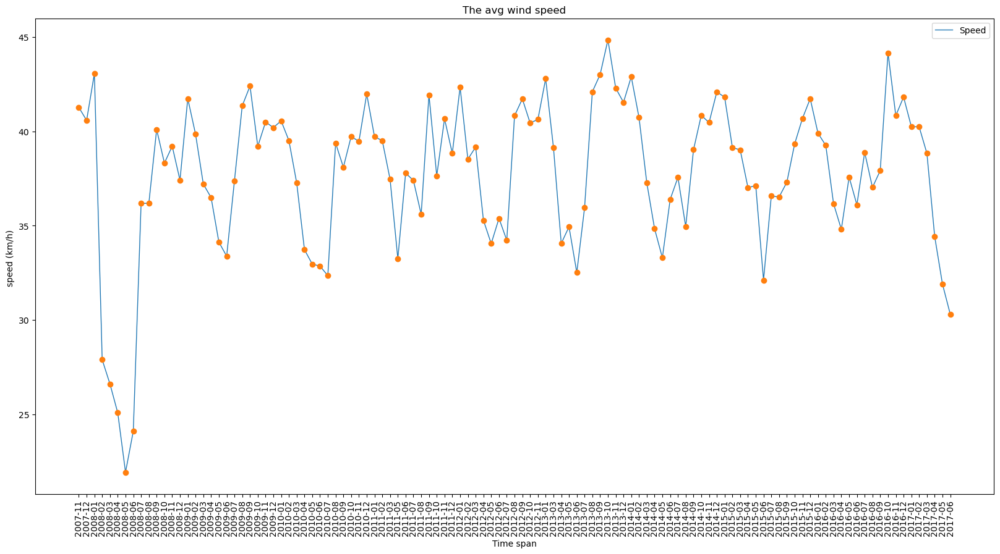

In [919]:
rain1 = data.drop_duplicates().groupby(['Mon_yr'])['WindGustSpeed'].agg(['mean']).sort_values(by=['Mon_yr'], ascending=True)
x = pd.Series(rain.index.values)
y1 = rain1['mean']
plt.figure(figsize=(20,10))
plt.plot(x,y1, linewidth=1, label= 'Speed')
plt.plot_date(x,y1)
plt.xlabel('Time span')
plt.ylabel('speed (km/h) ')
plt.title('The avg wind speed')
plt.xticks(rotation=90)
plt.legend()
plt.show()

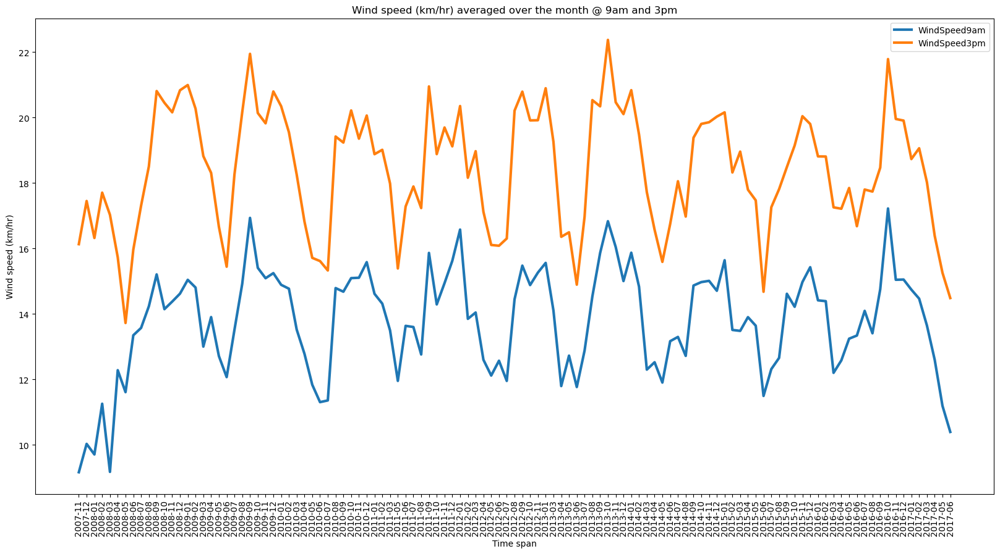

In [920]:
rain = data.drop_duplicates().groupby(['Mon_yr'])['WindSpeed9am'].agg(['mean']).sort_values(by=['Mon_yr'], ascending=True)
rain1 = data.drop_duplicates().groupby(['Mon_yr'])['WindSpeed3pm'].agg(['mean']).sort_values(by=['Mon_yr'], ascending=True)
x = pd.Series(rain.index.values)
y = rain['mean']
y1 = rain1['mean']
plt.figure(figsize=(20,10))
plt.plot(x,y, linewidth=3, label= 'WindSpeed9am')
plt.plot(x,y1, linewidth=3, label= 'WindSpeed3pm')
plt.xlabel('Time span')
plt.ylabel('Wind speed (km/hr)')
plt.title('Wind speed (km/hr) averaged over the month @ 9am and 3pm')
plt.xticks(rotation=90)
plt.legend()
plt.show()

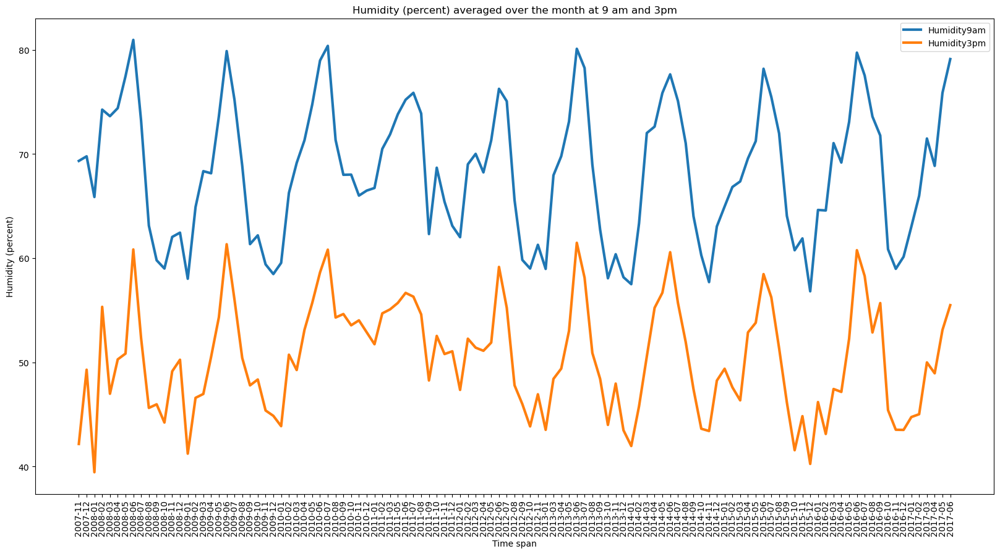

In [921]:
rain = data.drop_duplicates().groupby(['Mon_yr'])['Humidity9am'].agg(['mean']).sort_values(by=['Mon_yr'], ascending=True)
rain1 = data.drop_duplicates().groupby(['Mon_yr'])['Humidity3pm'].agg(['mean']).sort_values(by=['Mon_yr'], ascending=True)
x = pd.Series(rain.index.values)
y = rain['mean']
y1 = rain1['mean']
plt.figure(figsize=(20,10))
plt.plot(x,y, linewidth=3, label= 'Humidity9am')
plt.plot(x,y1, linewidth=3, label= 'Humidity3pm')
plt.xlabel('Time span')
plt.ylabel('Humidity (percent)')
plt.title('Humidity (percent) averaged over the month at 9 am and 3pm')
plt.xticks(rotation=90)
plt.legend()
plt.show()

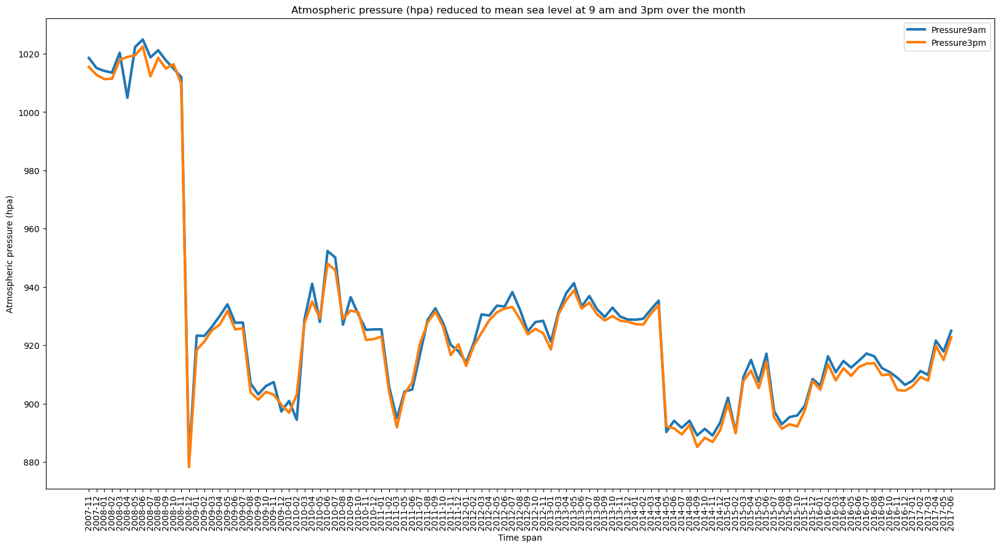

In [922]:
rain = data.drop_duplicates().groupby(['Mon_yr'])['Pressure9am'].agg(['mean']).sort_values(by=['Mon_yr'], ascending=True)
rain1 = data.drop_duplicates().groupby(['Mon_yr'])['Pressure3pm'].agg(['mean']).sort_values(by=['Mon_yr'], ascending=True)
x = pd.Series(rain.index.values)
y = rain['mean']
y1 = rain1['mean']
plt.figure(figsize=(20,10))
plt.plot(x,y, linewidth=3, label= 'Pressure9am')
plt.plot(x,y1, linewidth=3, label= 'Pressure3pm')
plt.xlabel('Time span')
plt.ylabel('Atmospheric pressure (hpa)')
plt.title('Atmospheric pressure (hpa) reduced to mean sea level at 9 am and 3pm over the month ')
plt.xticks(rotation=90)
plt.legend()
plt.show()

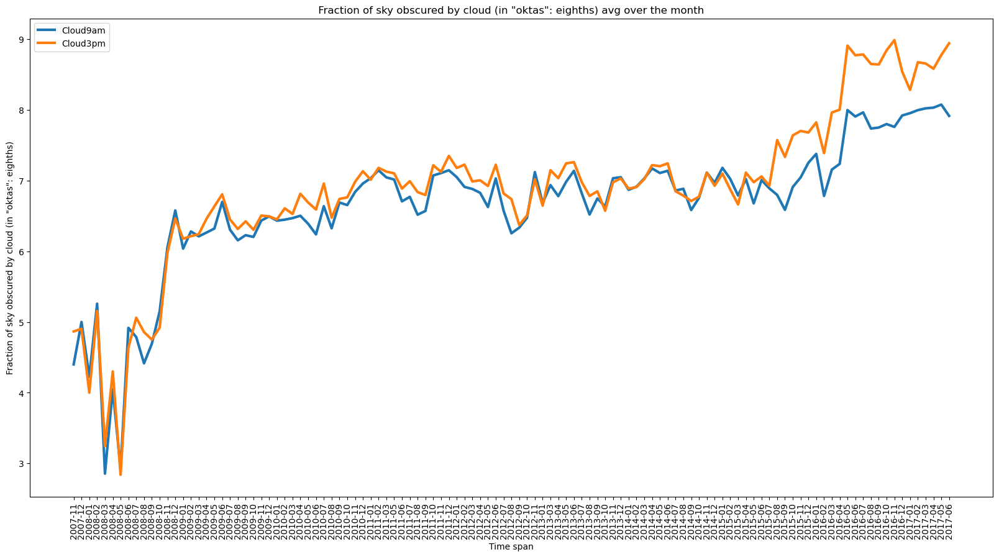

In [923]:
rain = data.drop_duplicates().groupby(['Mon_yr'])['Cloud9am'].agg(['mean']).sort_values(by=['Mon_yr'], ascending=True)
rain1 = data.drop_duplicates().groupby(['Mon_yr'])['Cloud3pm'].agg(['mean']).sort_values(by=['Mon_yr'], ascending=True)
x = pd.Series(rain.index.values)
y = rain['mean']
y1 = rain1['mean']
plt.figure(figsize=(20,10))
plt.plot(x,y, linewidth=3, label= 'Cloud9am')
plt.plot(x,y1, linewidth=3, label= 'Cloud3pm')
plt.xlabel('Time span')
plt.ylabel('Fraction of sky obscured by cloud (in "oktas": eighths)')
plt.title(' Fraction of sky obscured by cloud (in "oktas": eighths) avg over the month ')
plt.xticks(rotation=90)
plt.legend()
plt.show()

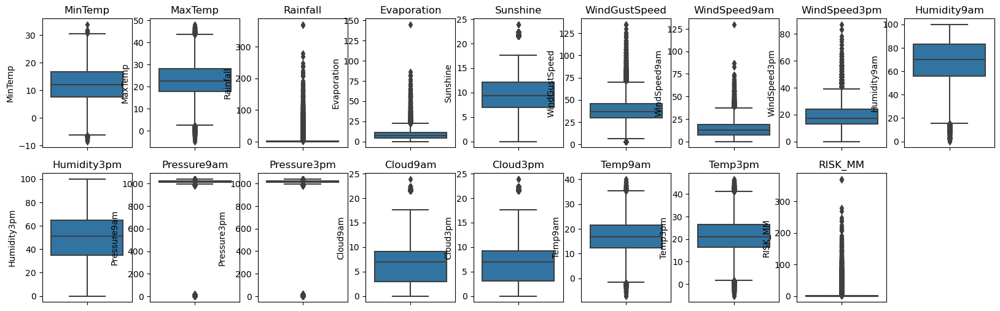

In [924]:
plt.figure(figsize=(20,6))
pos =1
for i in df_num.columns:
    plt.subplot(2,9,pos)
    sns.boxplot(y = df[i])
    plt.title(i)
    pos +=1


In [925]:
#% outliers
for k, v in df_num.items():
        q1 = v.quantile(0.25)
        q3 = v.quantile(0.75)
        irq = q3 - q1
        v_col = v[(v <= q1 - 1.5 * irq) | (v >= q3 + 1.5 * irq)]
        perc = np.shape(v_col)[0] * 100.0 / np.shape(data)[0]
        print("Column %s outliers = %.2f%%" % (k, perc))

Column MinTemp outliers = 0.04%
Column MaxTemp outliers = 0.32%
Column Rainfall outliers = 18.46%
Column Evaporation outliers = 1.37%
Column Sunshine outliers = 0.00%
Column WindGustSpeed outliers = 2.11%
Column WindSpeed9am outliers = 1.63%
Column WindSpeed3pm outliers = 1.73%
Column Humidity9am outliers = 1.14%
Column Humidity3pm outliers = 0.00%
Column Pressure9am outliers = 0.83%
Column Pressure3pm outliers = 0.66%
Column Cloud9am outliers = 0.00%
Column Cloud3pm outliers = 0.00%
Column Temp9am outliers = 0.17%
Column Temp3pm outliers = 0.52%
Column RISK_MM outliers = 18.71%


In [926]:
from collections import Counter
def detect_outliers(df,features):
    outlier_indices = []
    
    for c in features:
        #1st quartile
        Q1 = np.percentile(df[c],25)
        #3rd quartile
        Q3 = np.percentile(df[c],75)
        #IQR
        IQR = Q3-Q1
        #Outlier Step
        outlier_step= IQR * 1.5
        #Detect outlier and their indices
        outlier_list_col = df[(df[c]<Q1 - outlier_step) | (df[c]> Q3 + outlier_step)].index
        #store indices
        outlier_indices.extend(outlier_list_col)
        
    outlier_indices = Counter(outlier_indices)
    multiple_outliers = list(i for i,v in outlier_indices.items() if v > 1)
    
    return multiple_outliers

In [927]:
outlier_col = list(df.loc[detect_outliers(df,["Rainfall","RISK_MM"])].index)

In [928]:
#lets remove the outliers with index ref
df.drop(index=outlier_col,inplace=True)

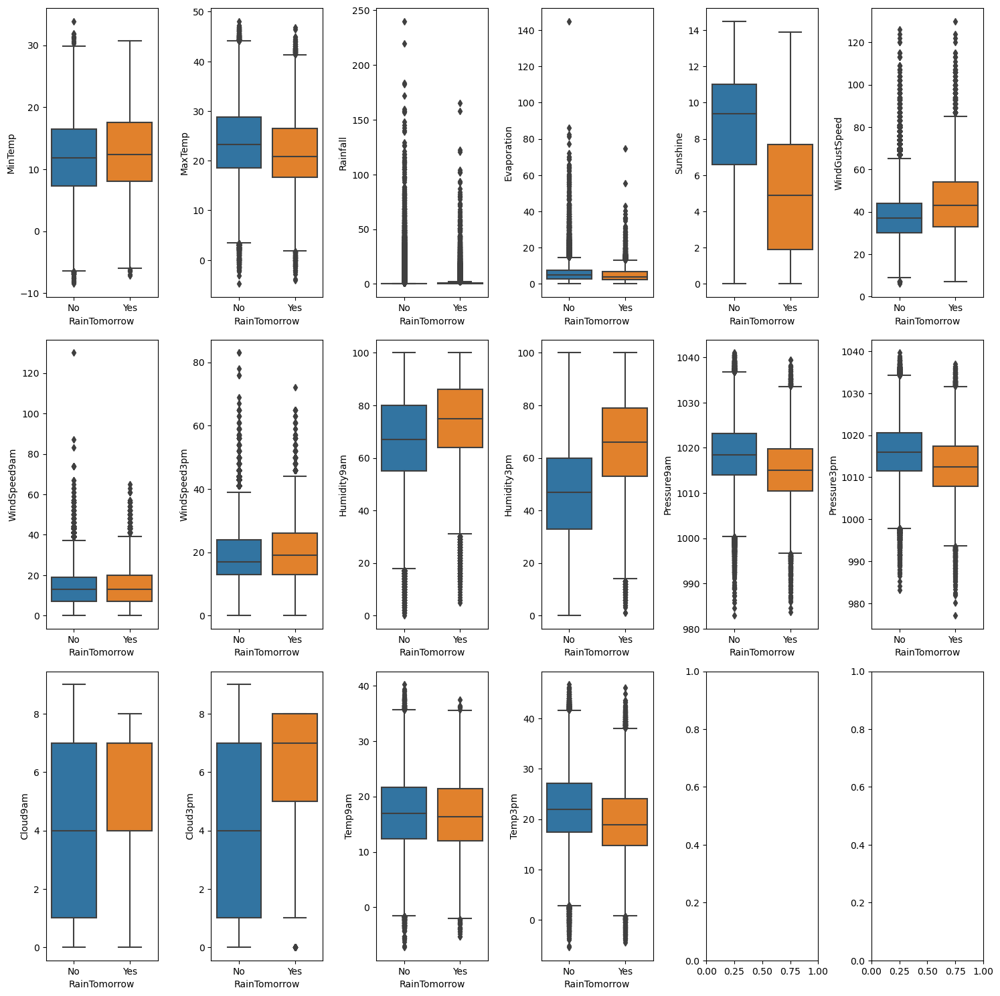

In [929]:
fig, axes = plt.subplots(3, 6, figsize = (15,15))
axes = axes.flatten()

for i in range(0,len(df_num.columns)-1):
    sns.boxplot(x="RainTomorrow", y=df_num.iloc[:,i], data=df, orient='v', ax=axes[i])
    plt.rcdefaults()
plt.tight_layout()
plt.show()

In [930]:
for i in df[["Rainfall","RISK_MM"]].columns:
    q1,q2,q3 = df[i].quantile([0.25,0.50,0.75])
    iqr  = q3-q1
    a = df[i]>q3+1.5*iqr
    b = df[i]<q1-1.5*iqr
    df[i] = np.where(a|b,q2,df[i])

In [931]:
df.shape

(131155, 28)

In [932]:
df['RainTomorrow'] = df['RainTomorrow'].replace({'Yes':1,'No':0})

In [933]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RISK_MM', 'RainTomorrow', 'Day', 'Month',
       'Year', 'season'],
      dtype='object')

In [934]:
df.drop(['Day', 'Month','Year', 'season'],axis=1,inplace=True)

In [935]:
corr = df.corr()

<AxesSubplot:>

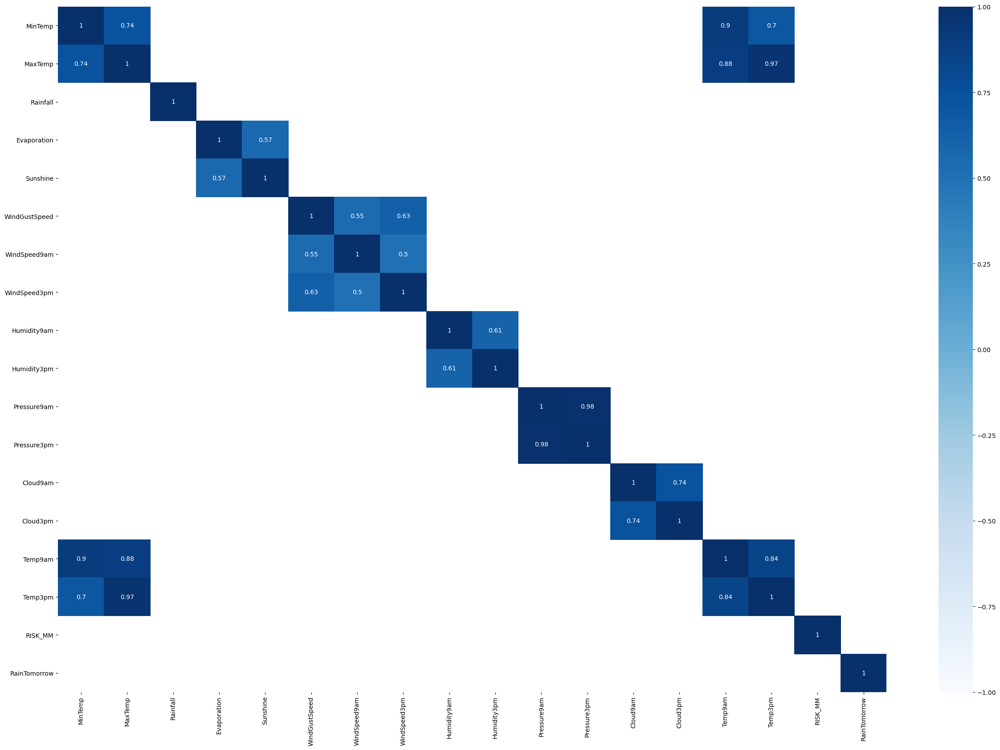

In [936]:
plt.figure(figsize=(30,20))
sns.heatmap(corr[(corr>0.5)|(corr<-0.5)],cmap='Blues',vmax=1,vmin=-1,annot=True,)

<AxesSubplot:xlabel='MaxTemp', ylabel='Temp3pm'>

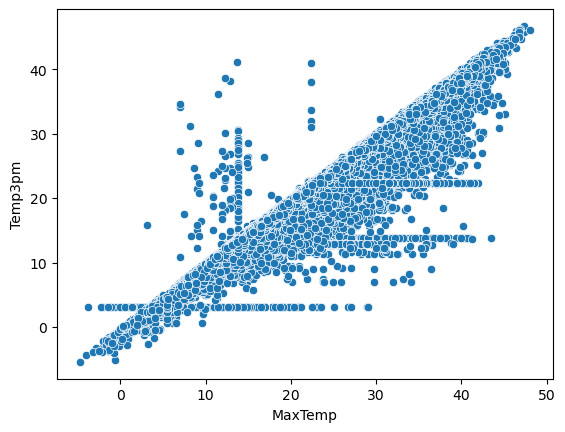

In [937]:
#Temp9am Pressure3pm 
sns.scatterplot(df['MaxTemp'],df['Temp3pm'])

<AxesSubplot:xlabel='Cloud9am', ylabel='Cloud3pm'>

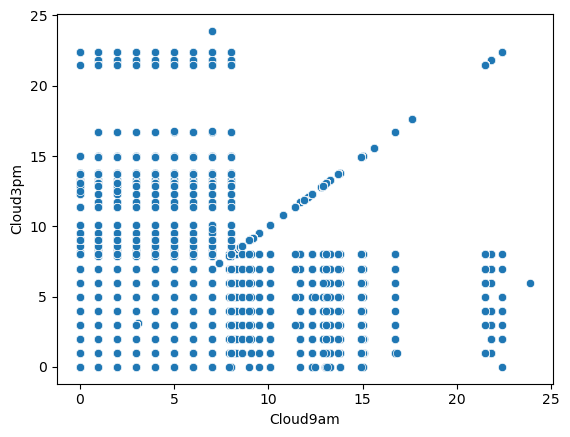

In [938]:
#Temp9am Pressure3pm 
sns.scatterplot(df['Cloud9am'],df['Cloud3pm'])

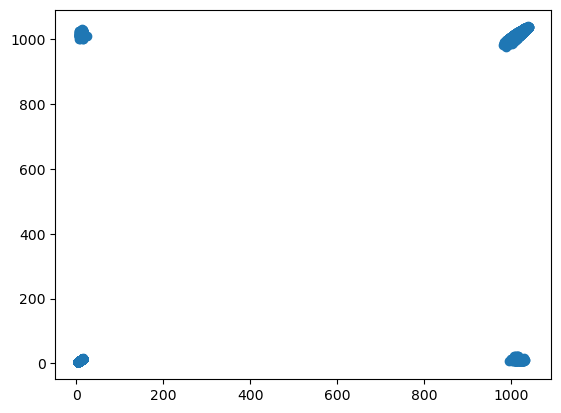

In [939]:
#Pressure3pm
plt.scatter(df['Pressure9am'],df['Pressure3pm'])

In [940]:
#we can drop temp9am and pressure9AM and cloud9am these 3 are having high correlation 
#and also the seprateblity with target is not so clear also not interpretable
df.drop(['Temp9am','Pressure9am','Cloud9am'],axis=1,inplace=True)

In [941]:
#Performing one hot encoding on RainToday, WindGustDir, WindDir9am, WindDir3pm, Location.
df_WindGustDir = pd.get_dummies(df["WindGustDir"], prefix="1")
df_WindDir9am = pd.get_dummies(df["WindDir9am"], prefix="2")
df_WindDir3pm = pd.get_dummies(df["WindDir3pm"], prefix="3")
df_RainToday = pd.get_dummies(df["RainToday"])
location_ohe = pd.get_dummies(df["Location"])
df_new = pd.concat([df, df_WindGustDir, df_WindDir9am, df_WindDir3pm, df_RainToday, location_ohe], axis=1)
df_new.drop(columns=["WindGustDir", "WindDir9am", "WindDir3pm", "RainToday", "Location"], axis=1, inplace=True)

In [942]:
df.shape

(131155, 21)

In [943]:
df_new.shape

(131155, 115)

In [944]:
df_new.head(2)

,Date,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud3pm,Temp3pm,RISK_MM,...,Richmond,Sale,SalmonGums,Sydney,SydneyAirport,Townsville,Tuggeranong,Uluru,WaggaWagga,Walpole,Watsonia,Williamtown,Witchcliffe,Wollongong,Woomera
0,2008-12-01,13.4,22.9,0.0,9.1,9.1,44.0,20.0,24.0,71.0,22.0,1007.1,9.1,21.8,0.0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2008-12-02,7.4,25.1,0.0,9.1,9.1,44.0,4.0,22.0,44.0,25.0,1007.8,9.1,24.3,0.0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [945]:
df_new['RainTomorrow'].value_counts()

0    110316
1     20839
Name: RainTomorrow, dtype: int64

In [946]:
df_new.drop('Date',axis=1,inplace=True)

In [947]:
x = df_new.loc[:,df_new.columns != 'RainTomorrow']

In [948]:
y= df_new['RainTomorrow']

In [949]:
from sklearn.model_selection import train_test_split

In [950]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.25)

In [951]:
xtrain.shape

(98366, 113)

In [952]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,roc_auc_score,roc_curve
from sklearn.linear_model import LogisticRegression

In [953]:
lr = LogisticRegression()

In [954]:
lr.fit(xtrain,ytrain)

LogisticRegression()

In [955]:
pred =  lr.predict(xtest)
acc = accuracy_score(ytest,pred)
test_score = lr.score(xtest,ytest)
train_score = lr.score(xtrain,ytrain)

In [956]:

tn, fp, fn, tp = confusion_matrix(ytest,pred).ravel()
lr_recall = round(tp/(tp+fn), 3)   
lr_precision = round(tp/(tp+fp), 3)  
lr_specificity =round(tn/(tn+fp),3)    
type_1_error = fp    
type_2_error = fn    
lr_recall, lr_precision, lr_specificity, type_1_error, type_2_error


(0.187, 0.592, 0.976, 668, 4208)

In [957]:
def print_class_report(predictions, alg_name):
    """
    Purpose
    ----------
    Function helps automate the report generated by the
    sklearn package. Useful for multiple model comparison

    Parameters:
    ----------
    predictions: The predictions made by the algorithm used
    alg_name: String containing the name of the algorithm used
    
    Returns:
    ----------
    Returns classification report generated from sklearn. 
    """
    print('Classification Report for {0}:'.format(alg_name))
    print(classification_report(ytest,predictions,target_names = ['Yes','No']))

In [958]:
print_class_report(pred, 'Logistic Regression')

Classification Report for Logistic Regression:
              precision    recall  f1-score   support

         Yes       0.86      0.98      0.92     27612
          No       0.59      0.19      0.28      5177

    accuracy                           0.85     32789
   macro avg       0.73      0.58      0.60     32789
weighted avg       0.82      0.85      0.82     32789



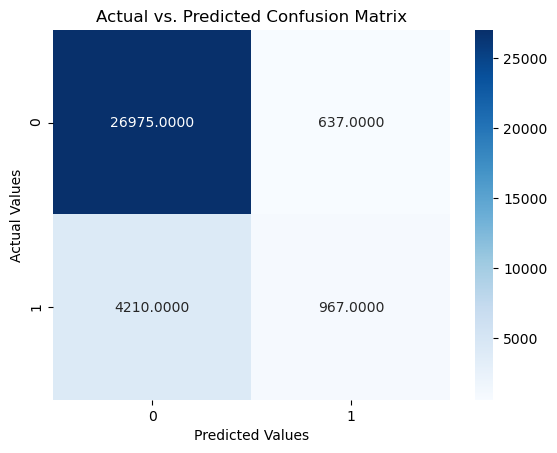

In [450]:
cm = confusion_matrix(ytest,pred)
sns.heatmap(cm,annot=True,cmap='Blues',fmt='.4f')
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('Actual vs. Predicted Confusion Matrix')
plt.show()

In [959]:
result = pd.DataFrame({'Model' : ['Logistic Regression'], 'Accuracy' : [acc], 'Precision' : [lr_precision],
                      'True positive rate(recall)' : [lr_recall], 'True negative rate' : [lr_specificity],
                       'False positive rate' :  [1-lr_specificity],'train_score' :[train_score],'test_score':[test_score]})
result

,Model,Accuracy,Precision,True positive rate(recall),True negative rate,False positive rate,train_score,test_score
0,Logistic Regression,0.851292,0.592,0.187,0.976,0.024,0.849511,0.851292


AUC: 0.767


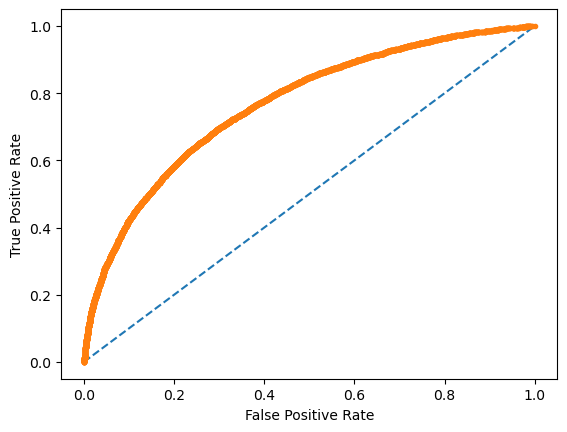

In [960]:
probs = lr.predict_proba(xtest)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(ytest, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
fpr, tpr, thresholds = roc_curve(ytest, probs)
# plot no skill
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
   
# show the plot
plt.show()


In [961]:
#!pip install imblearn #run if not installed

#the target data is imbalances lets try to balance and see if changes anything
#from imblearn.over_sampling import SMOTE
#smote = SMOTE(sampling_strategy='minority')
#xtrain, ytrain = smote.fit_resample(xtrain, ytrain)
#resample did not imporve recall

In [962]:
#lets try regularisation by l1 and l2
from sklearn.model_selection import GridSearchCV
lr = LogisticRegression(random_state=0)
parameters = {'penalty': ['l1', 'l2'],
              'fit_intercept':[True, False]
             }
grid_search2 = GridSearchCV(estimator=lr, param_grid=parameters, refit='roc_auc', scoring=['accuracy', 'roc_auc'], cv=10, n_jobs=-1)
grid_search2 = grid_search2.fit(xtrain, ytrain.values.ravel())

In [963]:
print("Best Parameters : ",grid_search2.best_params_)
print("Best AUC-ROC : ", grid_search2.best_score_)

Best Parameters :  {'fit_intercept': False, 'penalty': 'l2'}
Best AUC-ROC :  0.7711593356006491


In [964]:
lr_l2 = LogisticRegression(fit_intercept=False, penalty='l2', random_state=0)
lr_l2.fit(xtrain, ytrain)
predict = lr_l2.predict(xtest)
accuracy = accuracy_score(predict, ytest)
roc_score = roc_auc_score(predict, ytest)
print(accuracy)

0.8529689835005642


In [965]:
pred =  lr_l2.predict(xtest)
acc = accuracy_score(ytest,pred)
test_score = lr_l2.score(xtest,ytest)
train_score = lr_l2.score(xtrain,ytrain)
tn, fp, fn, tp = confusion_matrix(ytest,pred).ravel()
lr_recall = round(tp/(tp+fn), 3)   
lr_precision = round(tp/(tp+fp), 3) 
lr_specificity =round(tn/(tn+fp),3)    
type_1_error = fp    
type_2_error = fn    
lr_recall, lr_precision, lr_specificity, type_1_error, type_2_error


(0.196, 0.606, 0.976, 659, 4162)

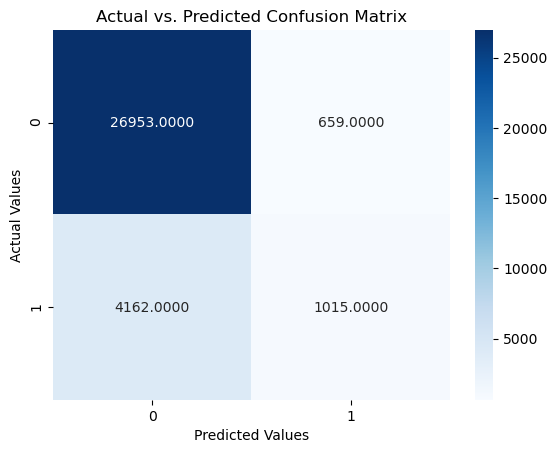

In [966]:
cm = confusion_matrix(ytest,pred)
sns.heatmap(cm,annot=True,cmap='Blues',fmt='.4f')
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('Actual vs. Predicted Confusion Matrix')
plt.show()

AUC: 0.769


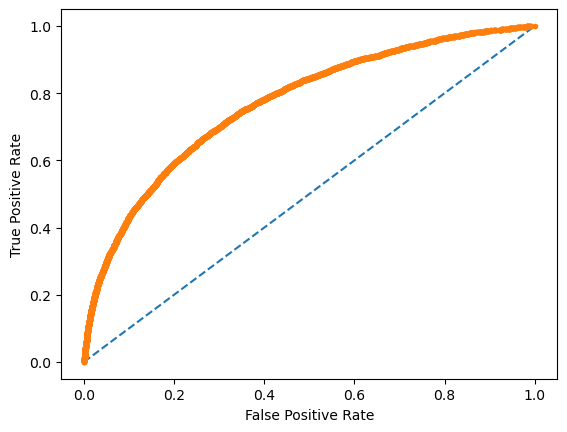

In [967]:
probs = lr_l2.predict_proba(xtest)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(ytest, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
fpr, tpr, thresholds = roc_curve(ytest, probs)
# plot no skill
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
   
# show the plot
plt.show()

In [968]:
result.loc[1] = ['Logistic Regression_l2',acc,lr_precision,lr_recall,lr_specificity,1-lr_specificity,train_score,test_score]
result

,Model,Accuracy,Precision,True positive rate(recall),True negative rate,False positive rate,train_score,test_score
0,Logistic Regression,0.851292,0.592,0.187,0.976,0.024,0.849511,0.851292
1,Logistic Regression_l2,0.852969,0.606,0.196,0.976,0.024,0.851066,0.852969


In [969]:
# we have slight imporment but recall,precision are still low

In [973]:
from sklearn.decomposition import PCA
pca = PCA(n_components=50)
pca.fit(xtrain)
XtrainPCA = pca.transform(xtrain)
XtestPCA = pca.transform(xtest)
XtrainPCA.shape

(98366, 50)

In [974]:
pca.explained_variance_ratio_

array([9.85204267e-01, 7.61027828e-03, 2.96737238e-03, 1.54512455e-03,
       1.06497843e-03, 5.06408031e-04, 3.83003658e-04, 3.53271866e-04,
       1.35112976e-04, 8.77289514e-05, 8.34611639e-05, 1.61698344e-05,
       2.60758891e-06, 1.45424762e-06, 1.29141838e-06, 1.22441313e-06,
       1.14171810e-06, 1.01674838e-06, 1.00876277e-06, 9.06157925e-07,
       8.70929140e-07, 8.09472978e-07, 8.06938995e-07, 7.86748983e-07,
       7.82071606e-07, 7.59836690e-07, 7.45629987e-07, 7.36736694e-07,
       7.27873883e-07, 7.01632702e-07, 6.94631614e-07, 6.77543693e-07,
       6.73245201e-07, 6.67033332e-07, 6.61720454e-07, 6.53611508e-07,
       6.39983489e-07, 6.33868423e-07, 6.16286321e-07, 6.08637966e-07,
       6.01187927e-07, 5.89196854e-07, 5.84223084e-07, 5.59576109e-07,
       5.54290490e-07, 5.42370495e-07, 5.26912257e-07, 5.19331591e-07,
       5.05129703e-07, 4.87623366e-07])

Text(0.5, 1.0, 'Variation covered by the PC Components')

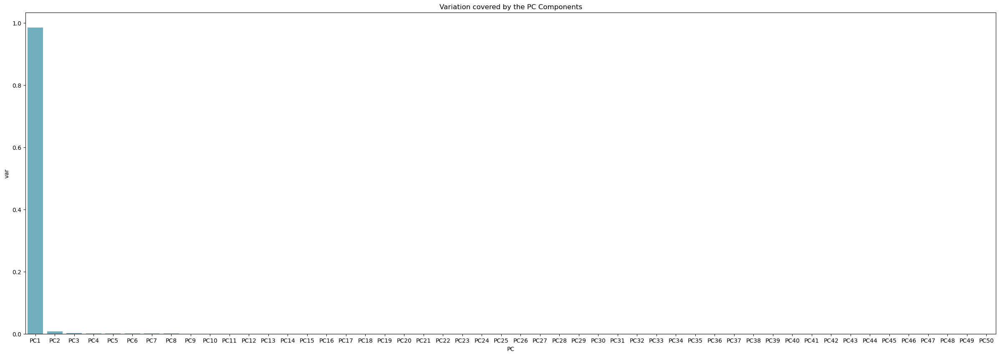

In [975]:
PC = ['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10',
     'PC11','PC12','PC13','PC14','PC15','PC16','PC17','PC18','PC19','PC20',
     'PC21','PC22','PC23','PC24','PC25','PC26','PC27','PC28','PC29','PC30',
     'PC31','PC32','PC33','PC34','PC35','PC36','PC37','PC38','PC39','PC40',
     'PC41','PC42','PC43','PC44','PC45','PC46','PC47','PC48','PC49','PC50']
pca_df = pd.DataFrame({'var':pca.explained_variance_ratio_, 'PC':PC})
plt.figure(figsize=(30,10))
sns.barplot(x='PC',y="var", data=pca_df, color="c")
plt.title('Variation covered by the PC Components')

In [976]:
#Since very High variance in PC1 to all columns, takingall PC1 axis columns into consideration
lr_PCA = LogisticRegression()
lr_PCA.fit(XtrainPCA, ytrain)
predict = lr_PCA.predict(XtestPCA)
accuracy = accuracy_score(predict, ytest)
roc_score = roc_auc_score(predict, ytest)
print(accuracy)

0.8601665192595077


In [977]:
pred =  lr_PCA.predict(XtestPCA)
acc = accuracy_score(ytest,pred)
test_score = lr_PCA.score(XtestPCA,ytest)
train_score = lr_PCA.score(XtrainPCA,ytrain)
tn, fp, fn, tp = confusion_matrix(ytest,pred).ravel()
lr_recall = round(tp/(tp+fn), 3)   
lr_precision = round(tp/(tp+fp), 3) 
lr_specificity =round(tn/(tn+fp),3)    
type_1_error = fp    
type_2_error = fn    
lr_recall, lr_precision, lr_specificity, type_1_error, type_2_error

(0.23, 0.665, 0.978, 599, 3986)

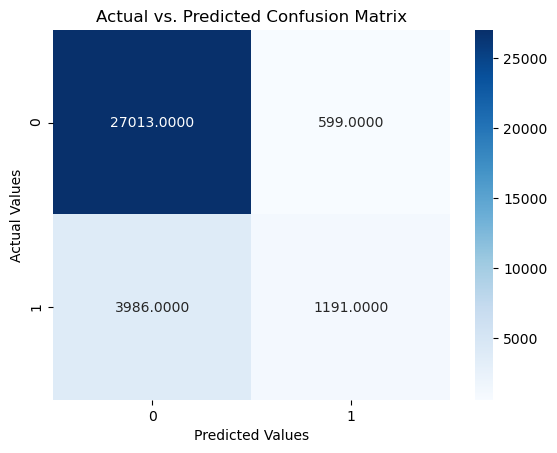

In [978]:
cm = confusion_matrix(ytest,pred)
sns.heatmap(cm,annot=True,cmap='Blues',fmt='.4f')
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('Actual vs. Predicted Confusion Matrix')
plt.show()

AUC: 0.791


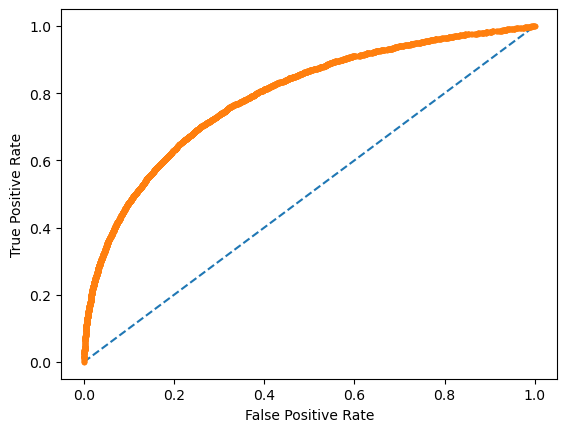

In [979]:
probs = lr_PCA.predict_proba(XtestPCA)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(ytest, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
fpr, tpr, thresholds = roc_curve(ytest, probs)
# plot no skill
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
   
# show the plot
plt.show()

In [980]:
result.loc[2] = ['Logistic Regression_PCA',acc,lr_precision,lr_recall,lr_specificity,1-lr_specificity,train_score,test_score]
result

,Model,Accuracy,Precision,True positive rate(recall),True negative rate,False positive rate,train_score,test_score
0,Logistic Regression,0.851292,0.592,0.187,0.976,0.024,0.849511,0.851292
1,Logistic Regression_l2,0.852969,0.606,0.196,0.976,0.024,0.851066,0.852969
2,Logistic Regression_PCA,0.860167,0.665,0.230,0.978,0.022,0.858722,0.860167


In [981]:
#I am not a huge Fan of PCA(blackbox approach and explanblity is difficult) 
#but this has worked for our model so lets go with it

In [982]:
from sklearn.tree import DecisionTreeClassifier

In [983]:
dt= DecisionTreeClassifier()

In [984]:
dt.fit(XtrainPCA,ytrain)

DecisionTreeClassifier()

In [985]:
dt.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': None,
 'splitter': 'best'}

In [986]:
pred = dt.predict(XtestPCA)
acc = accuracy_score(ytest,pred)
test_score = dt.score(XtestPCA,ytest)
train_score = dt.score(XtrainPCA,ytrain)
tn, fp, fn, tp = confusion_matrix(ytest,pred).ravel()
lr_recall = round(tp/(tp+fn), 3)   
lr_precision = round(tp/(tp+fp), 3) 
lr_specificity =round(tn/(tn+fp),3)    
type_1_error = fp    
type_2_error = fn    
lr_recall, lr_precision, lr_specificity, type_1_error, type_2_error

(0.381, 0.365, 0.876, 3424, 3207)

In [987]:
test_score,train_score

(0.7977675439934124, 0.9999695016570767)

In [988]:
#Over fitting 
#lets cross validate and confirm it for sure

In [989]:
from sklearn.model_selection import cross_val_score
tree_clf = DecisionTreeClassifier()
tree_scores = cross_val_score(tree_clf, XtrainPCA, ytrain, cv=7,)
tree_mean = tree_scores.mean()
print(tree_scores)
print(tree_mean)


[0.78908418 0.7958443  0.80066894 0.79974381 0.79725306 0.79184458
 0.79725306]
0.7959559907233844


In [990]:
print(tree_clf.criterion,tree_clf.max_depth,tree_clf.max_leaf_nodes)

gini None None


In [991]:
#As we know DT is a greddy model it will go as deep as posible to split each node
#Here we can see when we crossvalidate the train accuracy is near tp test and not over fitting

In [992]:
result.loc[3] = ['DecisionTreeClassifier',acc,lr_precision,lr_recall,lr_specificity,1-lr_specificity,train_score,test_score]
result

,Model,Accuracy,Precision,True positive rate(recall),True negative rate,False positive rate,train_score,test_score
0,Logistic Regression,0.851292,0.592,0.187,0.976,0.024,0.849511,0.851292
1,Logistic Regression_l2,0.852969,0.606,0.196,0.976,0.024,0.851066,0.852969
2,Logistic Regression_PCA,0.860167,0.665,0.230,0.978,0.022,0.858722,0.860167
3,DecisionTreeClassifier,0.797768,0.365,0.381,0.876,0.124,0.999970,0.797768


In [480]:
#lets prun  and find the best paramerter 
#this will be try and test method to get optimum parameters with good accuarcy and not overfit


In [993]:
model_params  = {
    
    "decision_tree":{
        "model": DecisionTreeClassifier(),
        "params":{
            'criterion':["entropy","gini"],
            "max_depth":[3,5,7,9],
            'max_leaf_nodes' :[3,5,7,9]
        }
    }
}


In [994]:
score=[]
for model_name,mp in model_params.items():
    clf = GridSearchCV(mp["model"],mp["params"],cv=8,return_train_score=False)
    clf.fit(x,y)
    score.append({
        "Model" : model_name,
        "Best_Score": clf.best_score_,
        "Best_Params": clf.best_params_
    })
df5 = pd.DataFrame(score,columns=["Model","Best_Params","Best_Score"])

In [995]:
clf.best_params_


{'criterion': 'gini', 'max_depth': 3, 'max_leaf_nodes': 5}

In [996]:
df5

,Model,Best_Params,Best_Score
0,decision_tree,"{'criterion': 'gini', 'max_depth': 3, 'max_lea...",0.863238


In [997]:
dt_prun= DecisionTreeClassifier(criterion='gini',max_depth=3,max_leaf_nodes=5)
dt_prun.fit(XtrainPCA,ytrain)
dt_prun.score(XtrainPCA,ytrain)


0.8473964581257751

In [998]:

pred = dt_prun.predict(XtestPCA)

In [999]:

def metrices(xtrain_data,ytrain_data,model,xtest_data,ytest_data):
    lst = []
    pred = model.predict(xtest_data)
    acc = accuracy_score(ytest_data,pred)
    test_score = model.score(xtest_data,ytest_data)
    train_score = model.score(xtrain_data,ytrain_data)
    tn, fp, fn, tp = confusion_matrix(ytest_data,pred).ravel()
    lr_recall = round(tp/(tp+fn), 3)   
    lr_precision = round(tp/(tp+fp), 3) 
    lr_specificity =round(tn/(tn+fp),3)    
    type_1_error = fp    
    type_2_error = fn  
    lst.append([lr_recall, lr_precision, lr_specificity, type_1_error, type_2_error,train_score,test_score])
    return lst

In [1000]:
metrices(XtrainPCA,ytrain,dt_prun,XtestPCA,ytest)

[[0.255, 0.529, 0.957, 1175, 3858, 0.8473964581257751, 0.8465034005306658]]

In [1001]:
def aoc(model,xtest_data,ytest_data):
    probs = model.predict_proba(XtestPCA)
# keep probabilities for the positive outcome only
    probs = probs[:, 1]
# calculate AUC
    auc = roc_auc_score(ytest, probs)
    print('AUC: %.3f' % auc)
# calculate roc curve
    fpr, tpr, thresholds = roc_curve(ytest, probs)
# plot no skill
    plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
    plt.plot(fpr, tpr, marker='.')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
   # show the plot
    plt.show()

AUC: 0.695


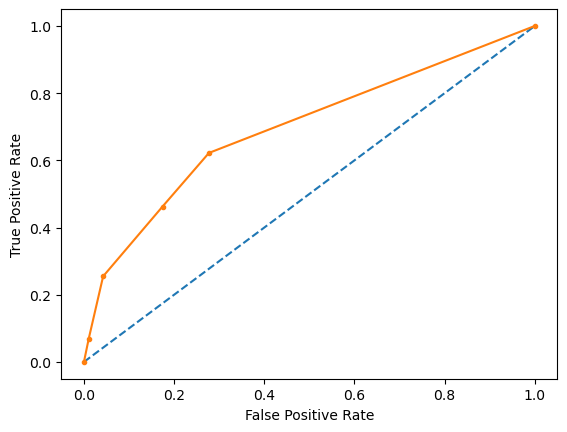

In [1002]:
aoc(dt_prun,XtestPCA,ytest)

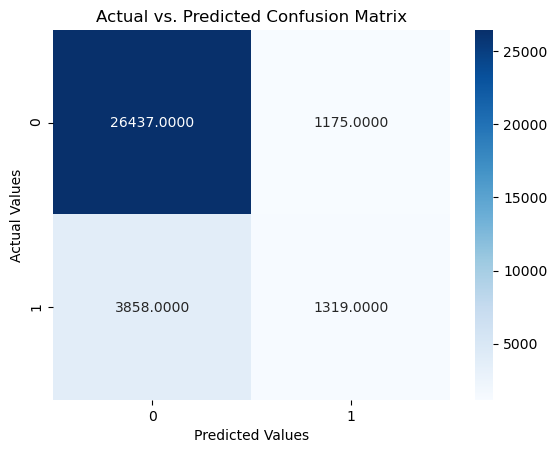

In [1003]:
cm = confusion_matrix(ytest,pred)
sns.heatmap(cm,annot=True,cmap='Blues',fmt='.4f')
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('Actual vs. Predicted Confusion Matrix')
plt.show()

In [1004]:
pred =  dt_prun.predict(XtestPCA)
acc = accuracy_score(ytest,pred)
test_score = dt_prun.score(XtestPCA,ytest)
train_score = dt_prun.score(XtrainPCA,ytrain)
tn, fp, fn, tp = confusion_matrix(ytest,pred).ravel()
lr_recall = round(tp/(tp+fn), 3)   
lr_precision = round(tp/(tp+fp), 3) 
lr_specificity =round(tn/(tn+fp),3)    
type_1_error = fp    
type_2_error = fn    
lr_recall, lr_precision, lr_specificity, type_1_error, type_2_error

(0.255, 0.529, 0.957, 1175, 3858)

In [1005]:
## Calculating feature importance
feature_cols = x.columns
feat_importance = dt_prun.tree_.compute_feature_importances(normalize=False)
feat_imp_dict = dict(zip(feature_cols, dt_prun.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.sort_values(by=0, ascending=False)

,0
Rainfall,0.438438
MaxTemp,0.433495
Evaporation,0.128067
2_S,0.000000
1_WNW,0.000000
1_WSW,0.000000
2_E,0.000000
2_ENE,0.000000
2_ESE,0.000000
2_N,0.000000


In [1006]:
result.loc[4] = ['DecisionTreeClassifier_PRUN',acc,lr_precision,lr_recall,lr_specificity,1-lr_specificity,train_score,test_score]
result

,Model,Accuracy,Precision,True positive rate(recall),True negative rate,False positive rate,train_score,test_score
0,Logistic Regression,0.851292,0.592,0.187,0.976,0.024,0.849511,0.851292
1,Logistic Regression_l2,0.852969,0.606,0.196,0.976,0.024,0.851066,0.852969
2,Logistic Regression_PCA,0.860167,0.665,0.230,0.978,0.022,0.858722,0.860167
3,DecisionTreeClassifier,0.797768,0.365,0.381,0.876,0.124,0.999970,0.797768
4,DecisionTreeClassifier_PRUN,0.846503,0.529,0.255,0.957,0.043,0.847396,0.846503


In [1007]:
#We have over come the overfitting and optimal parameters has increased the accuracies and 
#TNR but at recall precision still remains a problem

In [1008]:
from sklearn.ensemble import RandomForestClassifier

In [1009]:
rf = RandomForestClassifier()

In [1010]:
rf.fit(XtrainPCA,ytrain)

RandomForestClassifier()

In [1011]:
rf.score(XtrainPCA,ytrain)
pred = rf.predict(XtestPCA)

In [1012]:
rf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [1013]:
acc = accuracy_score(ytest,pred)
test_score = rf.score(XtestPCA,ytest)
train_score = rf.score(XtrainPCA,ytrain)
tn, fp, fn, tp = confusion_matrix(ytest,pred).ravel()
lr_recall = round(tp/(tp+fn), 3)   
lr_precision = round(tp/(tp+fp), 3) 
lr_specificity =round(tn/(tn+fp),3)    
type_1_error = fp    
type_2_error = fn    
lr_recall, lr_precision, lr_specificity, type_1_error, type_2_error

(0.243, 0.743, 0.984, 436, 3917)

AUC: 0.831


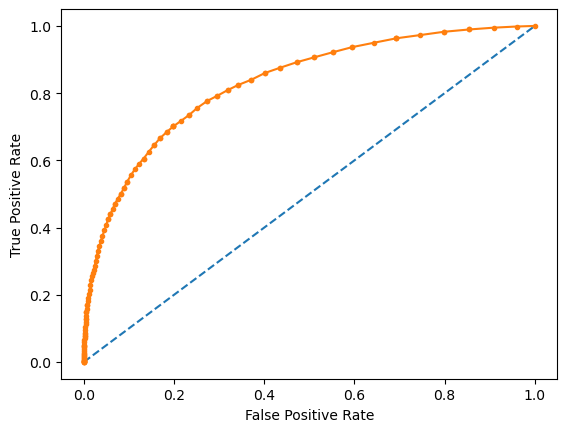

In [1014]:
aoc(rf,XtestPCA,ytest)

In [1015]:
## Calculating feature importance

feat_importance = rf.feature_importances_


feat_imp_dict = dict(zip(feature_cols, rf.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.sort_values(by=0, ascending=False)

,0
MaxTemp,0.071290
Rainfall,0.062986
Temp3pm,0.040163
MinTemp,0.036945
Evaporation,0.034958
WindGustSpeed,0.032445
Cloud3pm,0.028559
Humidity9am,0.025738
Pressure3pm,0.022756
WindSpeed9am,0.021821


In [1016]:
result.loc[5] = ['RandomForestClassifier',acc,lr_precision,lr_recall,lr_specificity,1-lr_specificity,train_score,test_score]
result

,Model,Accuracy,Precision,True positive rate(recall),True negative rate,False positive rate,train_score,test_score
0,Logistic Regression,0.851292,0.592,0.187,0.976,0.024,0.849511,0.851292
1,Logistic Regression_l2,0.852969,0.606,0.196,0.976,0.024,0.851066,0.852969
2,Logistic Regression_PCA,0.860167,0.665,0.230,0.978,0.022,0.858722,0.860167
3,DecisionTreeClassifier,0.797768,0.365,0.381,0.876,0.124,0.999970,0.797768
4,DecisionTreeClassifier_PRUN,0.846503,0.529,0.255,0.957,0.043,0.847396,0.846503
5,RandomForestClassifier,0.867242,0.743,0.243,0.984,0.016,0.999959,0.867242


In [1017]:
#Again we can see the over fitting in RF, lets prun and see

In [1018]:
rf_prun = RandomForestClassifier(bootstrap=True,max_depth=20,max_features='auto',min_samples_split=12,criterion='gini')

In [1019]:
rf_prun.fit(XtrainPCA,ytrain)

RandomForestClassifier(max_depth=20, min_samples_split=12)

In [1020]:
#OOB rate = avg of sample errors
#As we are using sampling with replacment there will be some samples left each time
#this will create some loss in each tree internally and 
#we can avg this errors and decide the best no of estimators requrired using OOB

In [1021]:
rf_prun.set_params(warm_start=True, 
                  oob_score=True)

min_estimators = 15
max_estimators = 500

error_rate = {}

for i in range(min_estimators, max_estimators + 1):
    rf_prun.set_params(n_estimators=i)
    rf_prun.fit(XtrainPCA,ytrain)

    oob_error =rf_prun.oob_score_
    error_rate[i] = oob_error

ValueError: n_estimators=15 must be larger or equal to len(estimators_)=100 when warm_start==True

In [705]:
#pd.Series(error_rate)[:50]

In [1022]:
## Calculating feature importance

feat_importance = rf.feature_importances_


feat_imp_dict = dict(zip(feature_cols, rf.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.sort_values(by=0, ascending=False)

,0
MaxTemp,0.071290
Rainfall,0.062986
Temp3pm,0.040163
MinTemp,0.036945
Evaporation,0.034958
WindGustSpeed,0.032445
Cloud3pm,0.028559
Humidity9am,0.025738
Pressure3pm,0.022756
WindSpeed9am,0.021821


Text(0.5, 1.0, 'OOB Error Rate Across various Forest sizes \n(From 15 to 500 trees)')

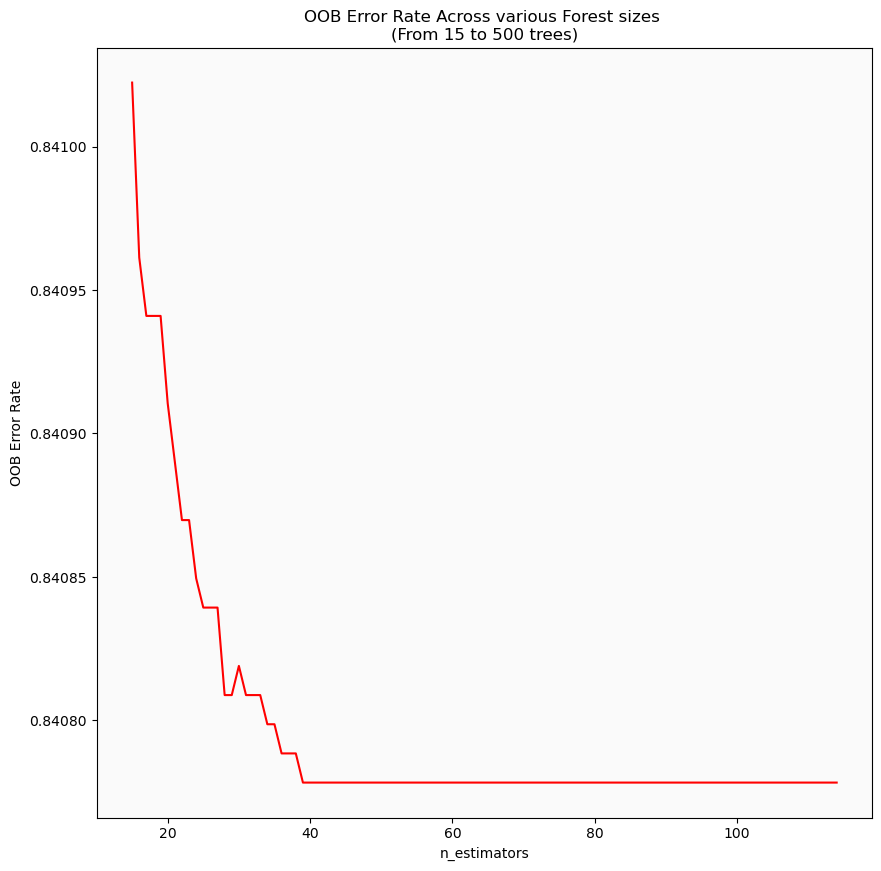

In [706]:
# Convert dictionary to a pandas series for easy plotting 
oob_series = pd.Series(pd.Series(error_rate)[:100]) #After 50 error rate is stable
fig, ax = plt.subplots(figsize=(10, 10))

ax.set_facecolor('#fafafa')

oob_series.plot(kind='line',color = 'red')

plt.xlabel('n_estimators')
plt.ylabel('OOB Error Rate')
plt.title('OOB Error Rate Across various Forest sizes \n(From 15 to 500 trees)')


In [699]:
print('OOB Error rate for 40 trees is: {0:.5f}'.format(oob_series[40]))

OOB Error rate for 40 trees is: 0.84078


In [1024]:
rf_prun1 = RandomForestClassifier(bootstrap=True,
                                 max_depth=20,
                                  min_samples_split=12, n_estimators=40,
                                 max_features='auto')

In [1025]:
rf_prun1.fit(XtrainPCA,ytrain)

RandomForestClassifier(max_depth=20, min_samples_split=12, n_estimators=40)

In [1026]:
pred = rf_prun1.predict(XtestPCA)
acc = accuracy_score(ytest,pred)
test_score = rf_prun1.score(XtestPCA,ytest)
train_score = rf_prun1.score(XtrainPCA,ytrain)
tn, fp, fn, tp = confusion_matrix(ytest,pred).ravel()
lr_recall = round(tp/(tp+fn), 3)   
lr_precision = round(tp/(tp+fp), 3) 
lr_specificity =round(tn/(tn+fp),3)    
type_1_error = fp    
type_2_error = fn    
lr_recall, lr_precision, lr_specificity, type_1_error, type_2_error

(0.23, 0.738, 0.985, 422, 3986)

In [1027]:
rf_prun1.score(XtestPCA,ytest)

0.8655646710787154

AUC: 0.825


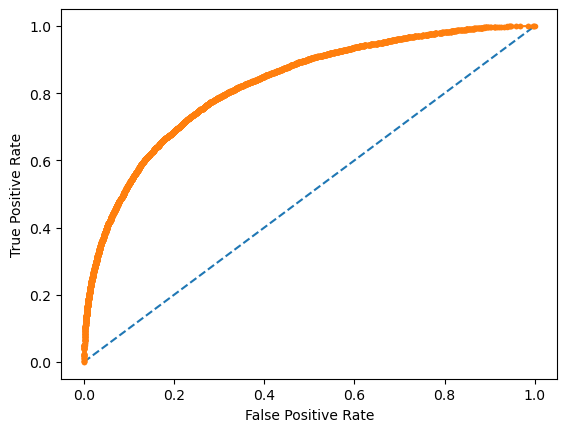

In [1028]:
aoc(rf_prun1,XtestPCA,ytest)

In [1029]:
result.loc[6] = ['RandomForestClassifier_Prun',acc,lr_precision,lr_recall,lr_specificity,1-lr_specificity,train_score,test_score]
result

,Model,Accuracy,Precision,True positive rate(recall),True negative rate,False positive rate,train_score,test_score
0,Logistic Regression,0.851292,0.592,0.187,0.976,0.024,0.849511,0.851292
1,Logistic Regression_l2,0.852969,0.606,0.196,0.976,0.024,0.851066,0.852969
2,Logistic Regression_PCA,0.860167,0.665,0.230,0.978,0.022,0.858722,0.860167
3,DecisionTreeClassifier,0.797768,0.365,0.381,0.876,0.124,0.999970,0.797768
4,DecisionTreeClassifier_PRUN,0.846503,0.529,0.255,0.957,0.043,0.847396,0.846503
5,RandomForestClassifier,0.867242,0.743,0.243,0.984,0.016,0.999959,0.867242
6,RandomForestClassifier_Prun,0.865565,0.738,0.230,0.985,0.015,0.935293,0.865565


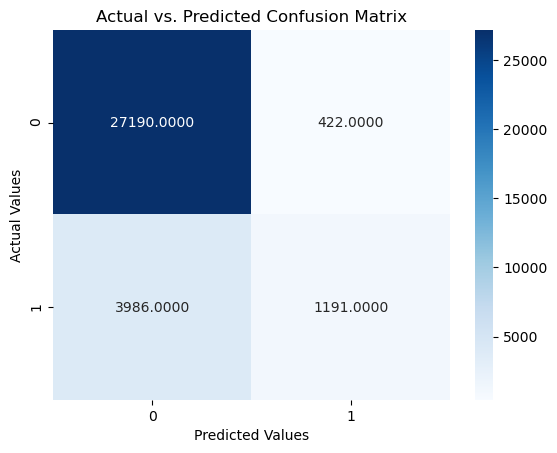

In [1030]:
cm = confusion_matrix(ytest,pred)
sns.heatmap(cm,annot=True,cmap='Blues',fmt='.4f')
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('Actual vs. Predicted Confusion Matrix')
plt.show()

In [1031]:
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()
nb.fit(XtrainPCA, ytrain)

GaussianNB()

In [1032]:
pred = nb.predict(XtestPCA)
acc = accuracy_score(ytest,pred)
test_score = nb.score(XtestPCA,ytest)
train_score = nb.score(XtrainPCA,ytrain)
tn, fp, fn, tp = confusion_matrix(ytest,pred).ravel()
lr_recall = round(tp/(tp+fn), 3)   
lr_precision = round(tp/(tp+fp), 3) 
lr_specificity =round(tn/(tn+fp),3)    
type_1_error = fp    
type_2_error = fn    
lr_recall, lr_precision, lr_specificity, type_1_error, type_2_error

(0.359, 0.407, 0.902, 2706, 3318)

AUC: 0.746


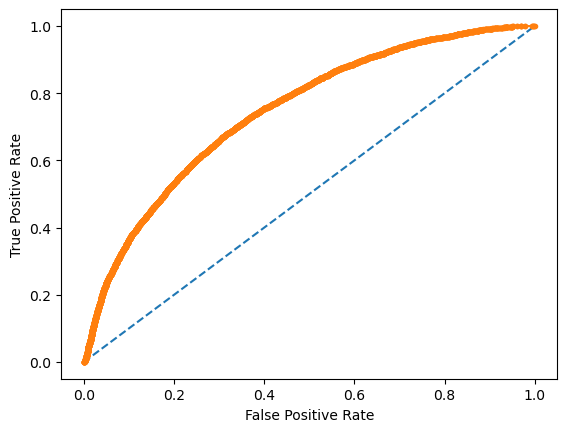

In [1033]:
aoc(nb,XtestPCA,ytest)

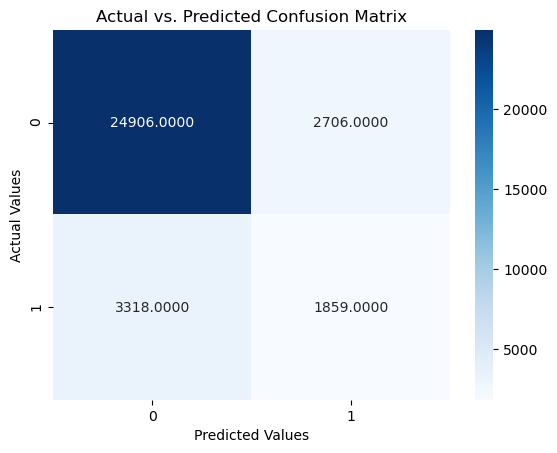

In [1034]:
cm = confusion_matrix(ytest,pred)
sns.heatmap(cm,annot=True,cmap='Blues',fmt='.4f')
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('Actual vs. Predicted Confusion Matrix')
plt.show()

In [1035]:
result.loc[7] = ['Naive Bayes',acc,lr_precision,lr_recall,lr_specificity,1-lr_specificity,train_score,test_score]
result

,Model,Accuracy,Precision,True positive rate(recall),True negative rate,False positive rate,train_score,test_score
0,Logistic Regression,0.851292,0.592,0.187,0.976,0.024,0.849511,0.851292
1,Logistic Regression_l2,0.852969,0.606,0.196,0.976,0.024,0.851066,0.852969
2,Logistic Regression_PCA,0.860167,0.665,0.230,0.978,0.022,0.858722,0.860167
3,DecisionTreeClassifier,0.797768,0.365,0.381,0.876,0.124,0.999970,0.797768
4,DecisionTreeClassifier_PRUN,0.846503,0.529,0.255,0.957,0.043,0.847396,0.846503
5,RandomForestClassifier,0.867242,0.743,0.243,0.984,0.016,0.999959,0.867242
6,RandomForestClassifier_Prun,0.865565,0.738,0.230,0.985,0.015,0.935293,0.865565
7,Naive Bayes,0.816280,0.407,0.359,0.902,0.098,0.816227,0.816280


In [811]:
from sklearn.neighbors import KNeighborsClassifier

kscores = []
for i in range(1,20):
    knn = KNeighborsClassifier(n_neighbors = i)
    knn.fit(XtrainPCA, ytrain)
    s = knn.score(XtestPCA, ytest)
    kscores.append(s)
plt.plot(range(1,20), kscores, 'o-')   
plt.xticks(range(1,20))
plt.show()

KeyboardInterrupt: 

In [814]:
pd.Series(kscores)

0     0.814877
1     0.852085
2     0.845466
3     0.858367
4     0.854707
5     0.861234
6     0.861325
7     0.861905
8     0.863125
9     0.864497
10    0.864345
11    0.863887
12    0.864162
13    0.865382
14    0.866297
15    0.865626
16    0.864955
17    0.865077
dtype: float64

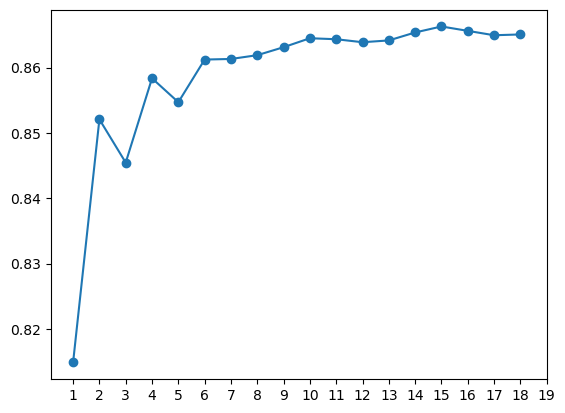

In [816]:
plt.plot(range(1,19), kscores, 'o-')   
plt.xticks(range(1,20))
plt.show()

In [1037]:
knn_5 = KNeighborsClassifier(n_neighbors = 5)
knn_5.fit(XtrainPCA, ytrain)

KNeighborsClassifier()

In [1038]:
pred = knn_5.predict(XtestPCA)
acc = accuracy_score(ytest,pred)
test_score = knn_5.score(XtestPCA,ytest)
train_score = knn_5.score(XtrainPCA,ytrain)
tn, fp, fn, tp = confusion_matrix(ytest,pred).ravel()
lr_recall = round(tp/(tp+fn), 3)   
lr_precision = round(tp/(tp+fp), 3) 
lr_specificity =round(tn/(tn+fp),3)    
type_1_error = fp    
type_2_error = fn    
lr_recall, lr_precision, lr_specificity, type_1_error, type_2_error

(0.33, 0.571, 0.953, 1285, 3468)

AUC: 0.757


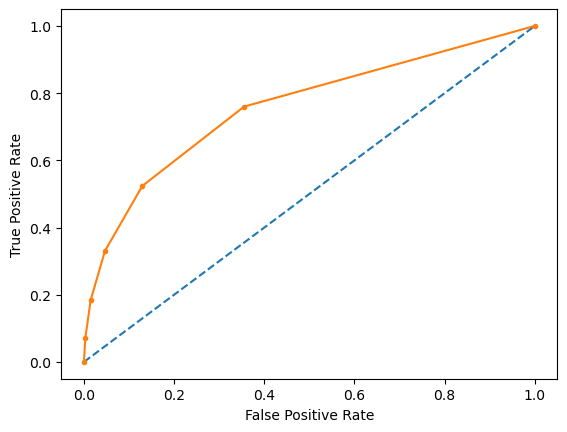

In [1039]:
aoc(knn_5,XtestPCA,ytest)

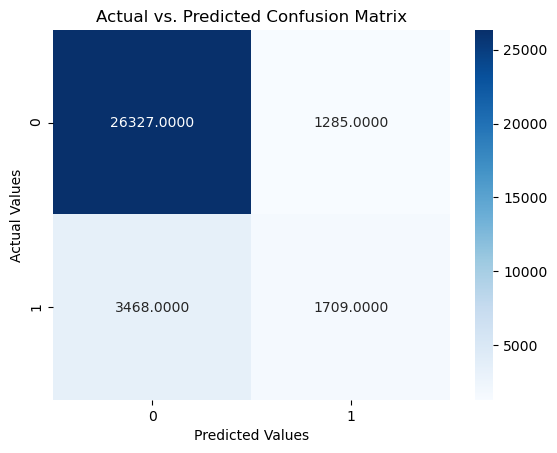

In [1040]:
cm = confusion_matrix(ytest,pred)
sns.heatmap(cm,annot=True,cmap='Blues',fmt='.4f')
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('Actual vs. Predicted Confusion Matrix')
plt.show()

In [1041]:
result.loc[8] = ['KNeighborsClassifier',acc,lr_precision,lr_recall,lr_specificity,1-lr_specificity,train_score,test_score]
result

,Model,Accuracy,Precision,True positive rate(recall),True negative rate,False positive rate,train_score,test_score
0,Logistic Regression,0.851292,0.592,0.187,0.976,0.024,0.849511,0.851292
1,Logistic Regression_l2,0.852969,0.606,0.196,0.976,0.024,0.851066,0.852969
2,Logistic Regression_PCA,0.860167,0.665,0.230,0.978,0.022,0.858722,0.860167
3,DecisionTreeClassifier,0.797768,0.365,0.381,0.876,0.124,0.999970,0.797768
4,DecisionTreeClassifier_PRUN,0.846503,0.529,0.255,0.957,0.043,0.847396,0.846503
5,RandomForestClassifier,0.867242,0.743,0.243,0.984,0.016,0.999959,0.867242
6,RandomForestClassifier_Prun,0.865565,0.738,0.230,0.985,0.015,0.935293,0.865565
7,Naive Bayes,0.816280,0.407,0.359,0.902,0.098,0.816227,0.816280
8,KNeighborsClassifier,0.855043,0.571,0.330,0.953,0.047,0.890297,0.855043


In [1042]:
from sklearn.svm import SVC
from sklearn import metrics
svc=SVC() #Default hyperparameters
svc.fit(XtrainPCA,ytrain)

SVC()

In [1045]:
pred = svc.predict(XtestPCA)
acc = accuracy_score(ytest,pred)
test_score = svc.score(XtestPCA,ytest)
train_score = svc.score(XtrainPCA,ytrain)
tn, fp, fn, tp = confusion_matrix(ytest,pred).ravel()
lr_recall = round(tp/(tp+fn), 3)   
lr_precision = round(tp/(tp+fp), 3) 
lr_specificity =round(tn/(tn+fp),3)    
type_1_error = fp    
type_2_error = fn    
lr_recall, lr_precision, lr_specificity, type_1_error, type_2_error

(0.095, 0.869, 0.997, 74, 4684)

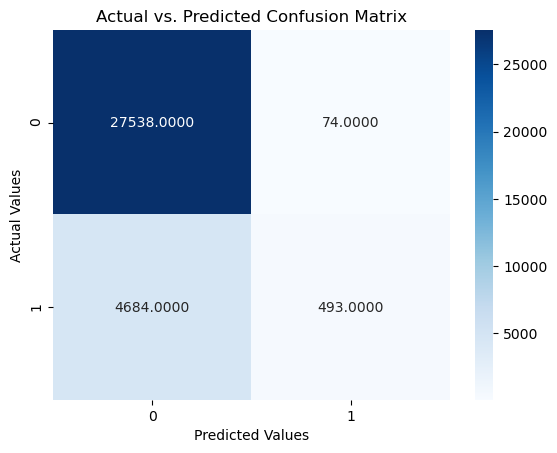

In [1048]:
cm = confusion_matrix(ytest,pred)
sns.heatmap(cm,annot=True,cmap='Blues',fmt='.4f')
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.title('Actual vs. Predicted Confusion Matrix')
plt.show()

In [1051]:
result.loc[9] = ['SVC',acc,lr_precision,lr_recall,lr_specificity,1-lr_specificity,train_score,test_score]
result

,Model,Accuracy,Precision,True positive rate(recall),True negative rate,False positive rate,train_score,test_score
0,Logistic Regression,0.851292,0.592,0.187,0.976,0.024,0.849511,0.851292
1,Logistic Regression_l2,0.852969,0.606,0.196,0.976,0.024,0.851066,0.852969
2,Logistic Regression_PCA,0.860167,0.665,0.23,0.978,0.022,0.858722,0.860167
3,DecisionTreeClassifier,0.797768,0.365,0.381,0.876,0.124,0.99997,0.797768
4,DecisionTreeClassifier_PRUN,0.846503,0.529,0.255,0.957,0.043,0.847396,0.846503
5,RandomForestClassifier,0.867242,0.743,0.243,0.984,0.016,0.999959,0.867242
6,RandomForestClassifier_Prun,0.865565,0.738,0.23,0.985,0.015,0.935293,0.865565
7,Naive Bayes,0.81628,0.407,0.359,0.902,0.098,0.816227,0.81628
8,KNeighborsClassifier,0.855043,0.571,0.330,0.953,0.047,0.890297,0.855043
9,SVC,0.85489,0.869,0.095,0.997,0.003,0.853364,0.85489


In [3]:
#Further Imporments :
#Use boosting techinques 
#Use Neural Network
#Hyper tune SVC with diff implemtations 
#the data is imbalnced , need to work on balancing data and retune the model.
#Work on to acess important feature for good prediction.


#Conclusions:

Random forest has give us overall good yeild for our data.

Features Like Min Max temp , Humidity,Sunshine are good predictors and chances of rain depend on these.

Sydney,canbeera,perth have the most rainfall.

Nhil,uluru and katherne has least occurances of rainfall.

Windgust is most in the west direction followed by north and south east and South west.

The rainfall has increased since 2009 and in 2007 the ratio of rain fall to no rainfall was high.

May,March has the high changes of rainfall and feb has least chanes from the data.

Summer and spring has more rainfall occurances.

Sunshine , humidity and windgustspeed has high sepratebility and good factors to decide rainfall occurs or not.